#### ***Background & Context***

The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.

Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas

You as a Data scientist at Thera bank need to <b>come up with a classification model that will help the bank improve its services so that customers do not renounce their credit cards</b>

You need to identify the best possible model that will give the required performance

#### ***Project # 5***

#### ***Objective***

* Explore and visualize the dataset.
* Build a classification model to predict if the customer is going to churn or not
* Optimize the model using appropriate techniques
* Generate a set of insights and recommendations that will help the bank

#### ***Data Dictionary***


* `CLIENTNUM`: Client number. Unique identifier for the customer holding the account
* `Attrition_Flag`: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
* `Customer_Age`: Age in Years
* `Gender`: Gender of the account holder
* `Dependent_count`: Number of dependents
* `Education_Level`:  Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, * * * College(refers to a college student), Post-Graduate, Doctorate.
* `Marital_Status`: Marital Status of the account holder
* `Income_Category`: Annual Income Category of the account holder
* `Card_Category`: Type of Card
* `Months_on_book`: Period of relationship with the bank
* `Total_Relationship_Count`: Total no. of products held by the customer
* `Months_Inactive_12_mon`: No. of months inactive in the last 12 months
* `Contacts_Count_12_mon`: No. of Contacts between the customer and bank in the last 12 months
* `Credit_Limit`: Credit Limit on the Credit Card
* `Total_Revolving_Bal`: The balance that carries over from one month to the next is the revolving balance
* `Avg_Open_To_Buy`: Open to Buy refers to the amount left on the credit card to use (Average of last 12 months)
* `Total_Trans_Amt`: Total Transaction Amount (Last 12 months)
* `Total_Trans_Ct`: Total Transaction Count (Last 12 months)
* `Total_Ct_Chng_Q4_Q1`: Ratio of the total transaction count in 4th quarter and the total transaction count in 1st quarter
* `Total_Amt_Chng_Q4_Q1`: Ratio of the total transaction amount in 4th quarter and the total transaction amount in 1st quarter
* `Avg_Utilization_Ratio`: Represents how much of the available credit the customer spent


#### ***Importing libraries***

In [1]:
# To help with reading and manipulating data
import pandas as pd
import numpy as np

# To help with data visualization
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# To be used for missing value imputation
from sklearn.impute import SimpleImputer

# To help with model building
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier,
)
from xgboost import XGBClassifier

# To get different metric scores, and split data
from sklearn import metrics
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
)

# To be used for data scaling and one hot encoding
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder

# To be used for tuning the model
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# To be used for creating pipelines and personalizing them
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

# To oversample and undersample data
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# To define maximum number of columns to be displayed in a dataframe
pd.set_option("display.max_columns", None)

# To supress scientific notations for a dataframe
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# To supress warnings
import warnings
warnings.filterwarnings("ignore")

#### ***Dataset Load and Review***

In [2]:
# load data

# Loading the dataset
bank = pd.read_csv("data/35_BankChurners.csv")

In [3]:
bank.shape

(10127, 21)

In [4]:
data = bank.copy()

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [6]:
data.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


In [7]:
data.tail()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.000,1851,2152.000,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,NaN,Divorced,$40K - $60K,Blue,25,4,2,3,4277.000,2186,2091.000,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.000,0,5409.000,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,NaN,$40K - $60K,Blue,36,4,3,3,5281.000,0,5281.000,0.535,8395,62,0.722,0.000
10126,714337233,Attrited Customer,43,F,2,Graduate,Married,Less than $40K,Silver,25,6,2,4,10388.000,1961,8427.000,0.703,10294,61,0.649,0.189


#### ***Check for duplicate records***

In [8]:
data.duplicated().sum()

np.int64(0)

#### ***Target Variable*** 

In [9]:
data.Attrition_Flag.value_counts(1) * 100

Attrition_Flag
Existing Customer   83.934
Attrited Customer   16.066
Name: proportion, dtype: float64

***Target Variable - Almost 16% customers are attrited Customer. Also data is imbalanced***

In [10]:
# check unique value for each column

data.nunique()

CLIENTNUM                   10127
Attrition_Flag                  2
Customer_Age                   45
Gender                          2
Dependent_count                 6
Education_Level                 6
Marital_Status                  3
Income_Category                 6
Card_Category                   4
Months_on_book                 44
Total_Relationship_Count        6
Months_Inactive_12_mon          7
Contacts_Count_12_mon           7
Credit_Limit                 6205
Total_Revolving_Bal          1974
Avg_Open_To_Buy              6813
Total_Amt_Chng_Q4_Q1         1158
Total_Trans_Amt              5033
Total_Trans_Ct                126
Total_Ct_Chng_Q4_Q1           830
Avg_Utilization_Ratio         964
dtype: int64

**Checking the value count for each category of categorical variables** 

In [11]:
# Making a list of all catrgorical variables
cat_cols = [
    "Gender",
    "Dependent_count",
    "Education_Level",
    "Marital_Status",
    "Income_Category",
    "Card_Category",
    "Total_Relationship_Count",
    "Months_Inactive_12_mon",
    "Contacts_Count_12_mon",
]

# Printing number of count of each unique value in each column
for column in cat_cols:
    print(data[column].value_counts(normalize=True, dropna=False) * 100)
    print("-" * 40)

Gender
F   52.908
M   47.092
Name: proportion, dtype: float64
----------------------------------------
Dependent_count
3   26.977
2   26.217
1   18.150
4   15.543
0    8.927
5    4.187
Name: proportion, dtype: float64
----------------------------------------
Education_Level
Graduate        30.888
High School     19.878
NaN             15.000
Uneducated      14.684
College         10.003
Post-Graduate    5.095
Doctorate        4.453
Name: proportion, dtype: float64
----------------------------------------
Marital_Status
Married    46.282
Single     38.936
NaN         7.396
Divorced    7.386
Name: proportion, dtype: float64
----------------------------------------
Income_Category
Less than $40K   35.163
$40K - $60K      17.676
$80K - $120K     15.157
$60K - $80K      13.844
abc              10.981
$120K +           7.179
Name: proportion, dtype: float64
----------------------------------------
Card_Category
Blue       93.177
Silver      5.480
Gold        1.145
Platinum    0.197
Name: pro

#### ***Key Observations***
* `Gender` - 53% of customers are male and 47% customers are female
* `Dependent_count` - 27% of customers have 3 dependent, 26% have 2 dependents, 18% have just one dependent, 16% have 4 dependents. 8% do not have any dependents. 
* `Education_Level` - Almost 31% customers are graduate, 20% have high school degree, 15% uneducated. 15% of customers did not disclose their education. 10% are in college. Very few customers have high degrees - 5% of Post-Graduate, 4% of Doctorate
* `Marital_Status` - Almost 46% of customers are married followed by 39% of customers who are single. Almost 7% customers have not shared their marital status or is missing and 7% are divorced
* `Income_Category` - 35% of customers have income less than 40K. 18% have income in the range 40K - 60K. 15% in range 80K - 120K, 14% in range 60K - 80K, 7% have income greater than 120K. There are about 11% customers who did not share their income. we will treat this as missing values
* `Card_Category` - Majority of customers (93%) of customers use Blue card. 
* `Total_Relationship_Count` - Almost 23% customers have 3 products with the bank, followed by 19% customers who have 4 and 5 products each. 
* `Months_Inactive_12_mon` - Almost 38% of customers were inactive for 3 months in last 12 months, followed by 32% of customers who were inactive for 2 months, and 22% of customers inactive for 1 month in last 12 months. 
* `Contacts_Count_12_mon` - In 33% cases, there were 3 contacts between customer and bank, for 32% of cases 2 contacts were made. 

In [12]:
# Treat abc as missing value in Income_category
data["Income_Category"] = data["Income_Category"].replace(["abc"], np.nan)

#### ***Statistical Summary for Numerical Columns***

In [13]:
num_cols = ['Customer_Age','Months_on_book','Credit_Limit', 'Total_Revolving_Bal',
            'Avg_Open_To_Buy', 'Total_Trans_Amt','Total_Trans_Ct',  'Total_Amt_Chng_Q4_Q1','Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']
data[num_cols].describe().T

,count,mean,std,min,25%,50%,75%,max
Customer_Age,10127.000,46.326,8.017,26.000,41.000,46.000,52.000,73.000
Months_on_book,10127.000,35.928,7.986,13.000,31.000,36.000,40.000,56.000
Credit_Limit,10127.000,8631.954,9088.777,1438.300,2555.000,4549.000,11067.500,34516.000
Total_Revolving_Bal,10127.000,1162.814,814.987,0.000,359.000,1276.000,1784.000,2517.000
Avg_Open_To_Buy,10127.000,7469.140,9090.685,3.000,1324.500,3474.000,9859.000,34516.000
Total_Trans_Amt,10127.000,4404.086,3397.129,510.000,2155.500,3899.000,4741.000,18484.000
Total_Trans_Ct,10127.000,64.859,23.473,10.000,45.000,67.000,81.000,139.000
Total_Amt_Chng_Q4_Q1,10127.000,0.760,0.219,0.000,0.631,0.736,0.859,3.397
Total_Ct_Chng_Q4_Q1,10127.000,0.712,0.238,0.000,0.582,0.702,0.818,3.714
Avg_Utilization_Ratio,10127.000,0.275,0.276,0.000,0.023,0.176,0.503,0.999


#### ***Key Observations***
* `Customer_Age` - Average and median age of bank's customers is 46 years, minimum age is 26 and max is 73 years
* `Months_on_book` - Average and median months customers have stayed with bank is around 36 months. Customers have stayed for a minimum of 13 months and maximum of 56 months
* `Credit_Limit` - Average credit limit is 8,652 dollars, median is 4,549 dollars, min credit limit is 1,438 dollars and max is 34,516 dollars. Data is right skewed. 
* `Total_Revolving_Bal` - Average revolving balance is 1,163 dollars, median is 1,276 dollars. Minimum revolving balance is zero dollars and maximum is 2,517 dollars. 
* `Avg_Open_To_Buy` - Average open to buy is 7,469 dollars, median is 3,474 dollars. Min is 3 dollars and max is 34,516 dollars. Data is right skewed
* `Total_Trans_Amt` - Average total transaction amount is 4,404, median is 3,899, minimum is 510 and max is 18,484 dollars
* `Total_Trans_Ct` - Avergae total transaction count is 64.859 which is very close to median 67. Min is 10 transaction and maximum is 139 transaction 
* `Total_Amt_Chng_Q4_Q1` - Q4/Q1 amount average is 0.76 and median is very close 0.74. Min is zero and max is 3.397. Data is right skewed 
* `Total_Ct_Chng_Q4_Q1` - Q4/Q1 count average is 0.712 and median is very close 0.70. Min is zero and max is 3.71. Data is right skewed 
* `Avg_Utilization_Ratio` - Average of credit utilization is 0.275 and median is 0.176. Min is zero and max is 0.999 (fully utilized). Data is right skewed

#### ***Check for missing values***

In [14]:
data.isna().sum().sort_values(ascending=False)

Education_Level             1519
Income_Category             1112
Marital_Status               749
Attrition_Flag                 0
CLIENTNUM                      0
Dependent_count                0
Gender                         0
Customer_Age                   0
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

In [15]:
# percentage of missing values
(data.isna().sum().sort_values(ascending=False) / data.shape[0]) * 100

Education_Level            15.000
Income_Category            10.981
Marital_Status              7.396
Attrition_Flag              0.000
CLIENTNUM                   0.000
Dependent_count             0.000
Gender                      0.000
Customer_Age                0.000
Card_Category               0.000
Months_on_book              0.000
Total_Relationship_Count    0.000
Months_Inactive_12_mon      0.000
Contacts_Count_12_mon       0.000
Credit_Limit                0.000
Total_Revolving_Bal         0.000
Avg_Open_To_Buy             0.000
Total_Amt_Chng_Q4_Q1        0.000
Total_Trans_Amt             0.000
Total_Trans_Ct              0.000
Total_Ct_Chng_Q4_Q1         0.000
Avg_Utilization_Ratio       0.000
dtype: float64

***There are 3 features which has null values - Education_Level, Income_Category and Marital_Status. We'll impute them later***

#### ***Univariate analysis***

***Helper Functions***

In [16]:
# Function to create a histogram and boxplot combined for visualization of numerical features for Univariate Analysis
def num_analysis_hist_box(data, feature, figsize=(10, 5)):
    """
    Boxplot and histogram combined
    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (10,5))
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize)  # creating the 2 subplots
    
    sns.boxplot(data=data, x=feature, ax=ax_box2, showmeans=True, color="lightgreen")  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(data=data, x=feature, kde=True, ax=ax_hist2, color='skyblue')  # For histogram
    
    ax_hist2.axvline(data[feature].mean(), color="green", linestyle="--")  # Add mean to the histogram
    ax_hist2.axvline(data[feature].median(), color="black", linestyle="-")  # Add median to the histogram

In [17]:
# Function to plot count and percentage barplots side by side for categorical features for Univariate Analysis
def cat_analysis_count_and_perct(data, column, figsize=(10, 5)):
    """
    Plots two countplots side by side: one with count labels, one with percentage labels.
    Args:
        data (pd.DataFrame): The DataFrame containing the data.
        column (str): The column to plot.
        figsize (tuple): Figure size for the plots.
    """
    fig, axes = plt.subplots(1, 2, figsize=figsize)
    categories = data[column].value_counts().index
    total = len(data)
    
    # Countplot with count labels
    ax1 = sns.countplot(data=data, x=column, hue=column, order=categories, ax=axes[0], palette='Set2')
    axes[0].set_title('Counts per ' + column)
    axes[0].set_xlabel(column)
    axes[0].set_ylabel('Count')
    axes[0].tick_params(axis='x', rotation=90)
    for p in ax1.patches:
        count = int(p.get_height())
        ax1.annotate(str(count), (p.get_x() + p.get_width() / 2, p.get_height()),
                     ha='center', va='bottom', fontsize=10, color='black')
    
    # Countplot with percentage labels
    ax2 = sns.countplot(data=data, x=column, hue=column, order=categories, ax=axes[1], palette='Set2')
    axes[1].set_title('Percentage per ' + column)
    axes[1].set_xlabel(column)
    axes[1].set_ylabel('Percentage')
    axes[1].tick_params(axis='x', rotation=90)
    for p in ax2.patches:
        percent = 100 * p.get_height() / total
        ax2.annotate(f'{percent:.1f}%', (p.get_x() + p.get_width() / 2, p.get_height()),
                     ha='center', va='bottom', fontsize=10, color='blue')
    
    plt.tight_layout()
    plt.show()

***Observation on Attrition_Flag***

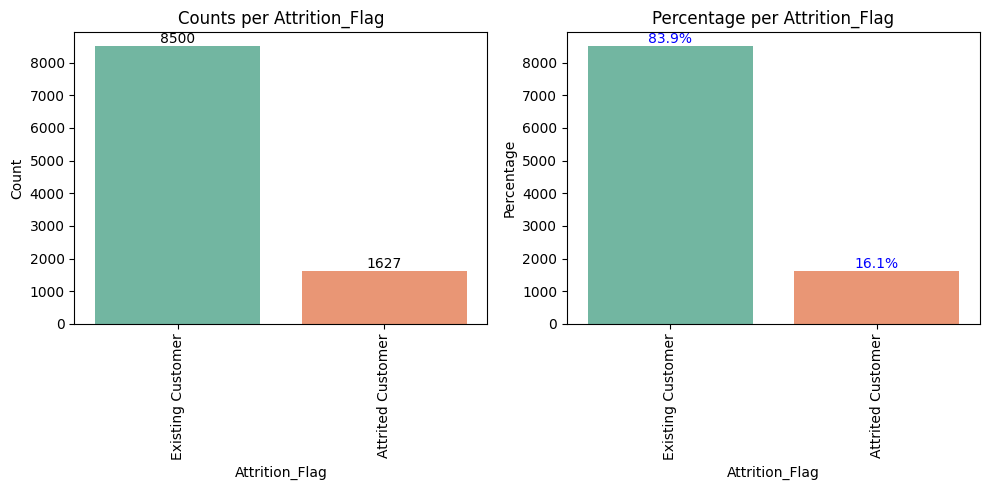

In [18]:
cat_analysis_count_and_perct(data, "Attrition_Flag")

- *the class distribution in the target variable is imbalanced.*
- *We have 84% of existing customers and 16% of Attrited customers*

***Observation on Gender***

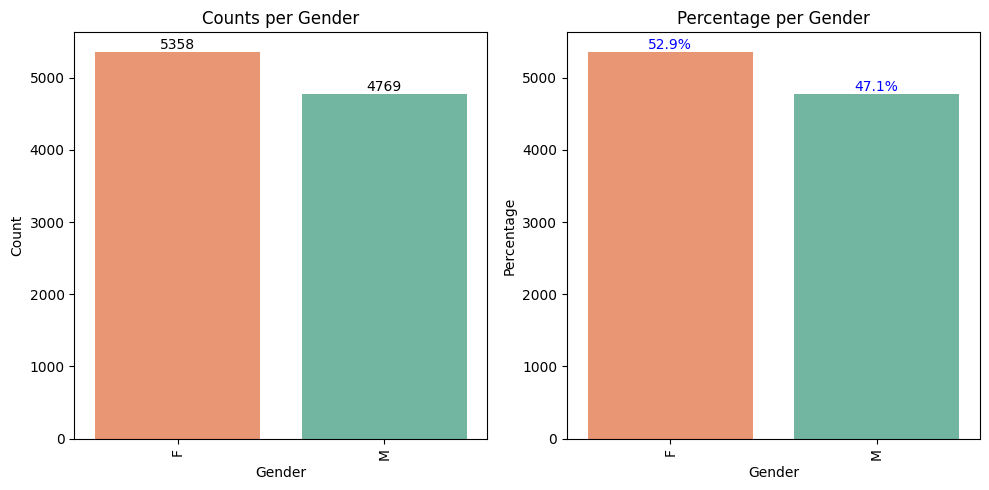

In [19]:
cat_analysis_count_and_perct(data, "Gender")

* *There are more male (53%) customers compared to female (47%)*

***Observation on Dependent_count***

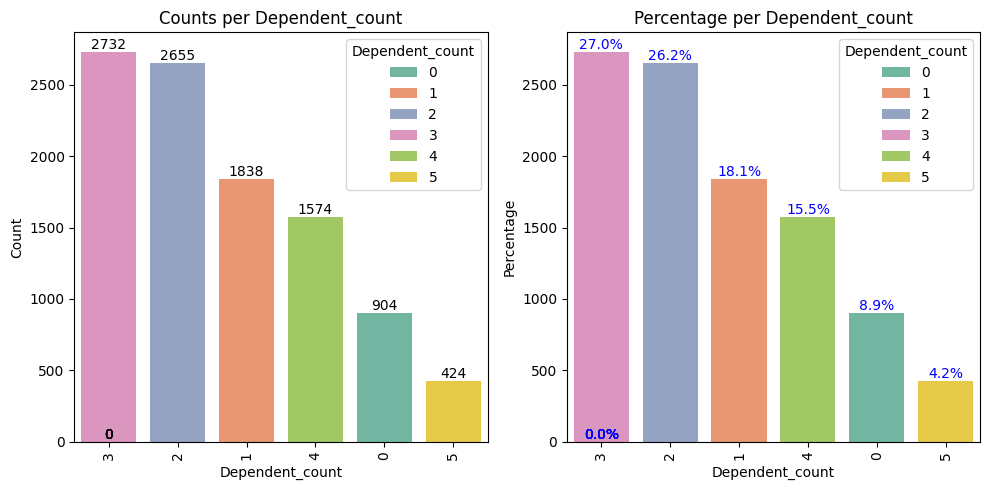

In [20]:
cat_analysis_count_and_perct(data, "Dependent_count")

* *Most of the credit card users have either 2 or 3 dependent.* 

***Observation on Total_Relationship_Count***

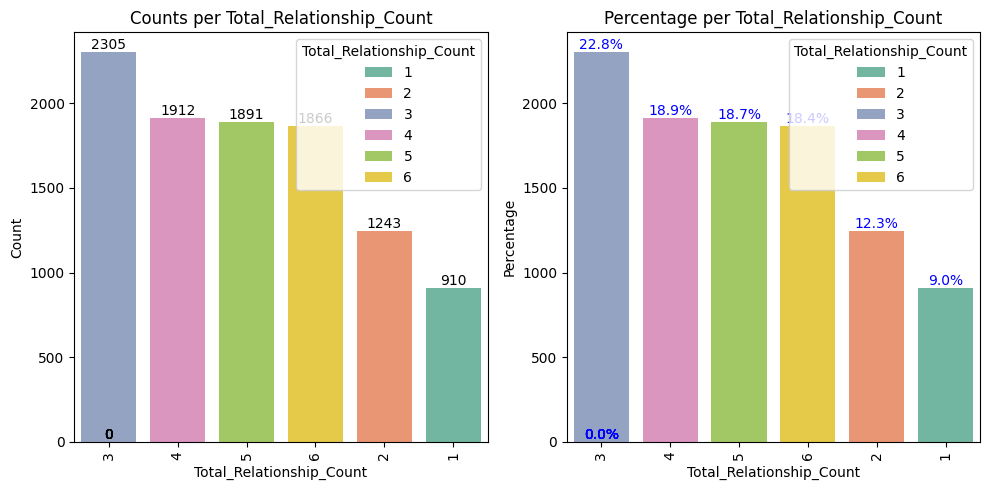

In [21]:
cat_analysis_count_and_perct(data, "Total_Relationship_Count")

* *Most of the customers have either 3 or more products with the bank*

***Observation on Months_Inactive_12_mon***

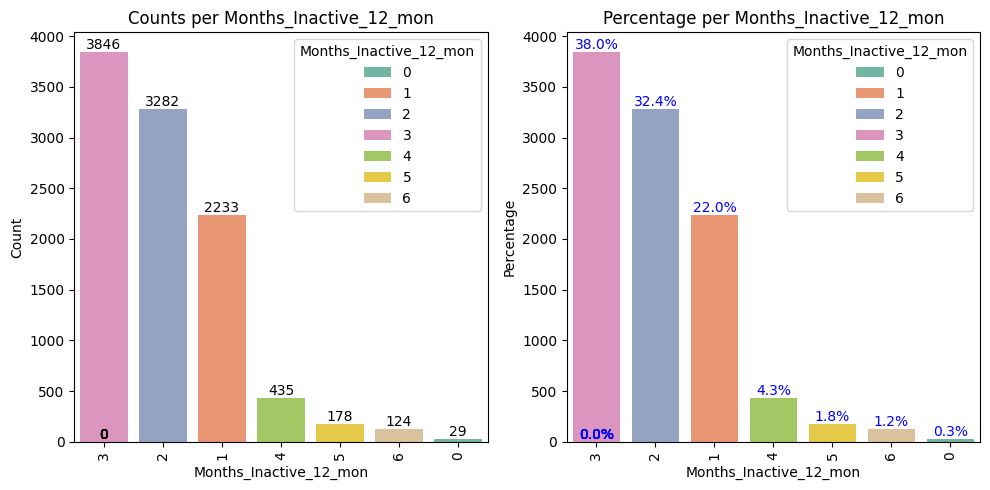

In [22]:
cat_analysis_count_and_perct(data, "Months_Inactive_12_mon")

* *38% customers were inactive for 3 months, 32.4% for 2 months and 22% customers were inactive for 1 month*

***Observation on Education_Level***

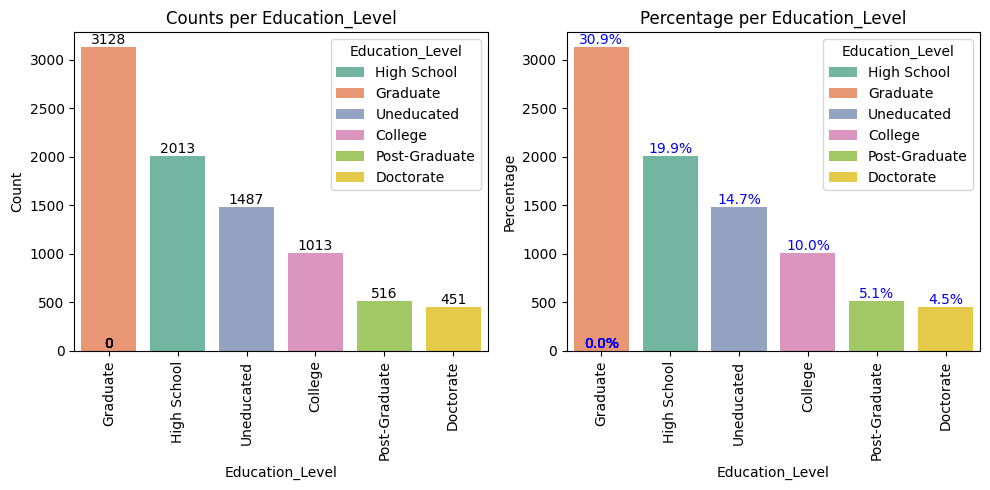

In [23]:
cat_analysis_count_and_perct(data, "Education_Level")

* *Almost 31% credit card users are Graduate and about 20% have completed just high school. About 15% are uneducated. Educated users like Post-Graduate and Doctorate consitute very small percentage* 

***Observation on Marital_Status***

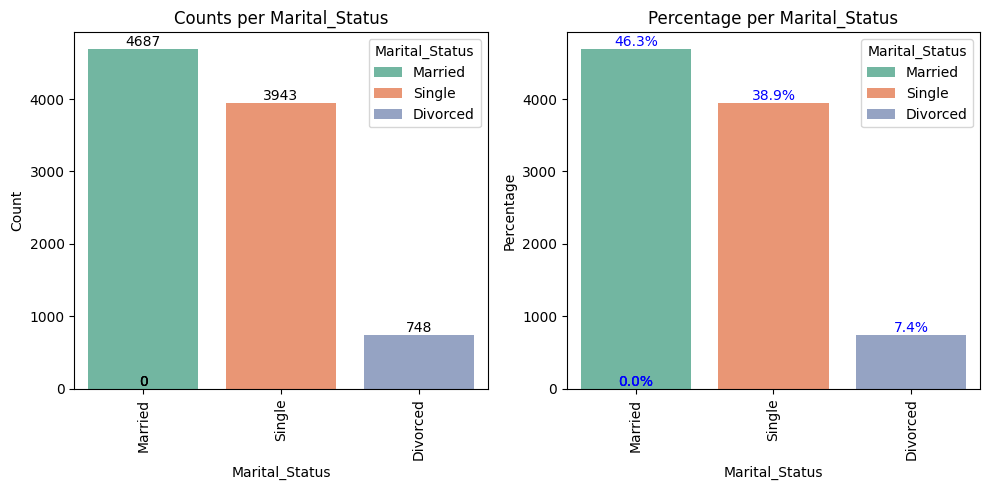

In [24]:
cat_analysis_count_and_perct(data, "Marital_Status")

* *Almost 46% customers are married and 39% are single*

***Observation on Income_Category***

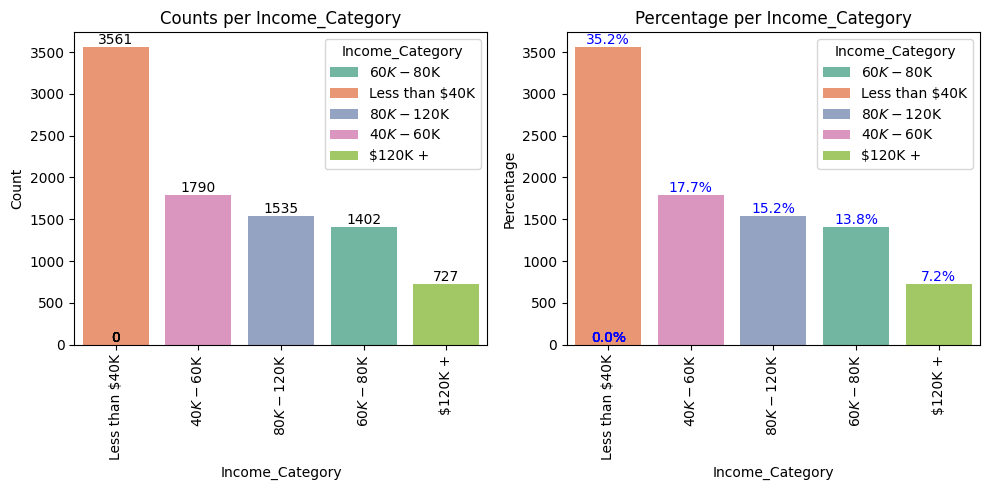

In [25]:
cat_analysis_count_and_perct(data, "Income_Category")

* *Almost 35% customers earn less than 40K. About 18% earn between 40K-60K, 15.2 percent earn between 80K-120K, 13.8 percent earn between 60K - 80K*

***Observation on Card_Category***

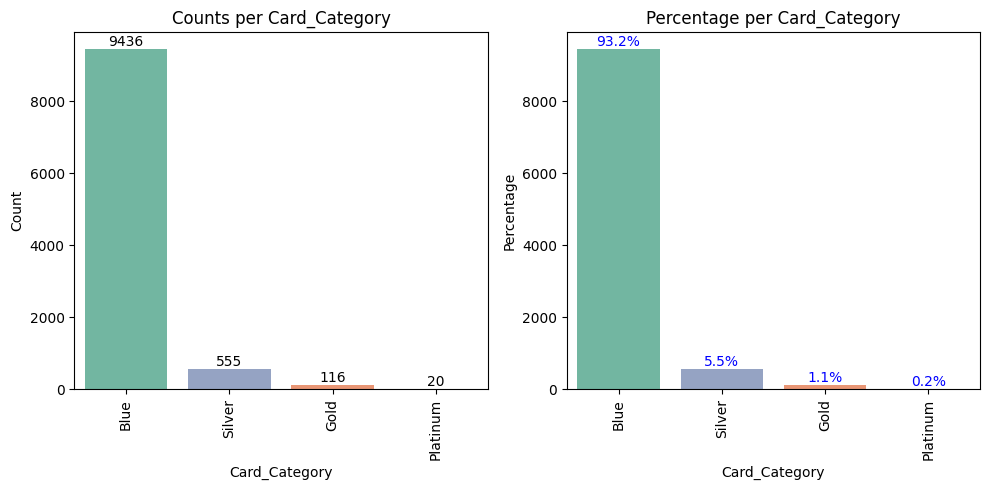

In [26]:
cat_analysis_count_and_perct(data, "Card_Category")

* *Almost 93.2% customers have Blue card, followed by Silver (5.5%)*

***Observation on Contacts_Count_12_mon***

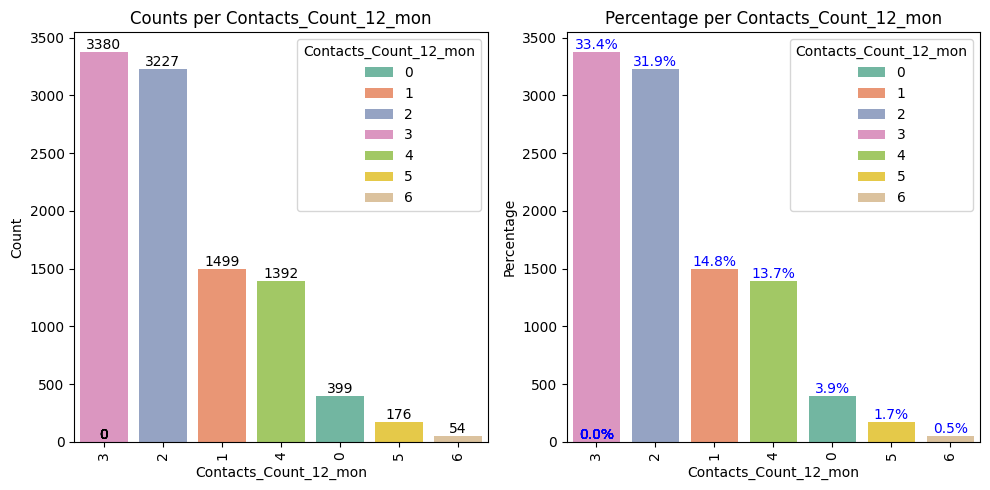

In [27]:
cat_analysis_count_and_perct(data, "Contacts_Count_12_mon")

* *In Majority of cases (~67%), Customer Bank contact happened 2-3 times in last 12 months*

***Observation on Age***

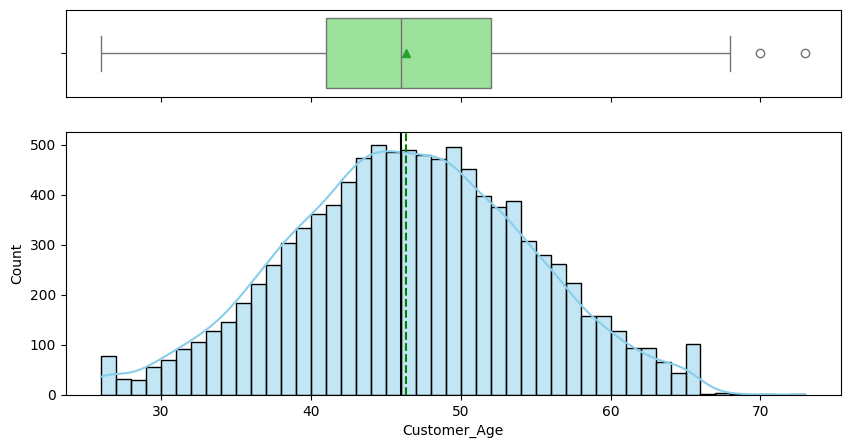

In [28]:
num_analysis_hist_box(data, "Customer_Age")

* *Customer Age follows normal distribution, although there are very few outlier on the higher side*

***Observation on Months_on_book***

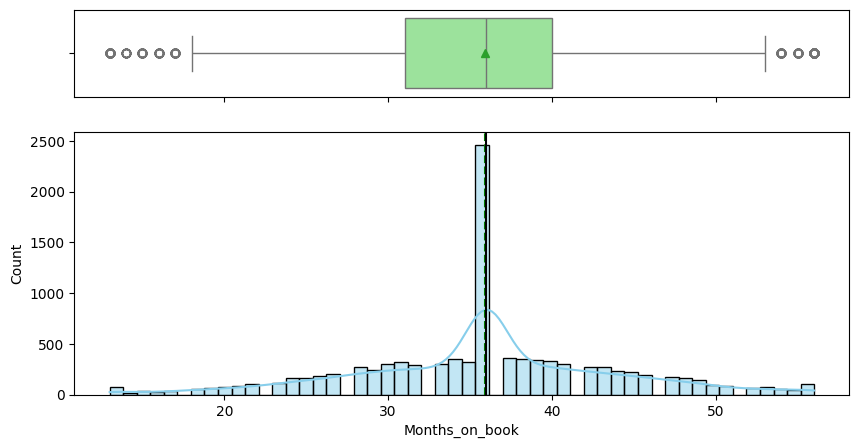

In [29]:
num_analysis_hist_box(data, "Months_on_book")

* *Majority of customers have been with the bank for nearly 35/36 months*

***Observation on Credit_Limit***

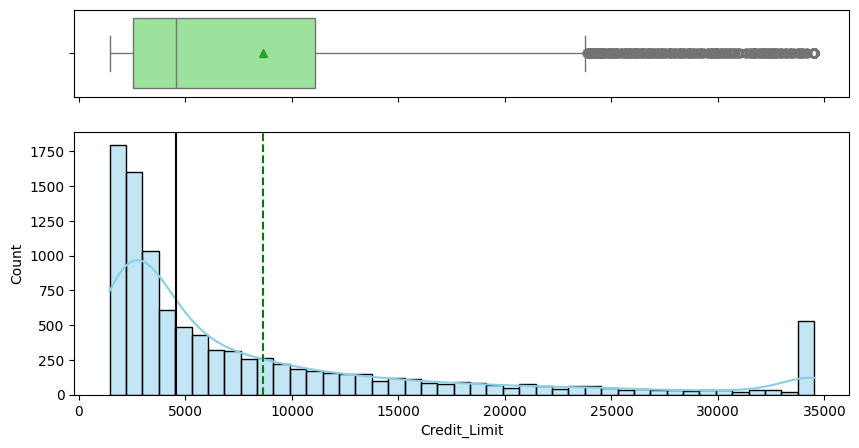

In [30]:
num_analysis_hist_box(data, "Credit_Limit")

* *Credit Limit data is right skewed, which may be possible as certain high income (yet to be verified) or high usage (yet to be verified) customers may have high credit limit*
* *There are quite few customers who have credit limit greater than 33000*

***Observation on Total_Revolving_Bal***

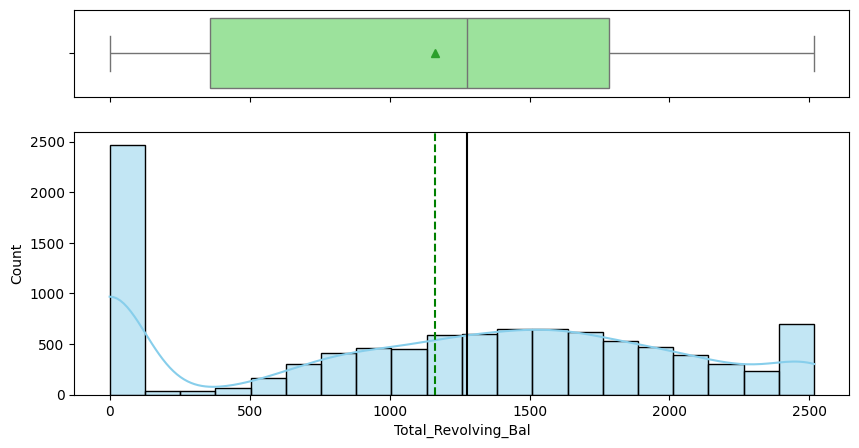

In [31]:
num_analysis_hist_box(data, "Total_Revolving_Bal")

* *Most of the customers have zero revolving balance. Thre are also few customers who have revolving balance around 2500*

***Observation on Avg_Open_To_Buy***

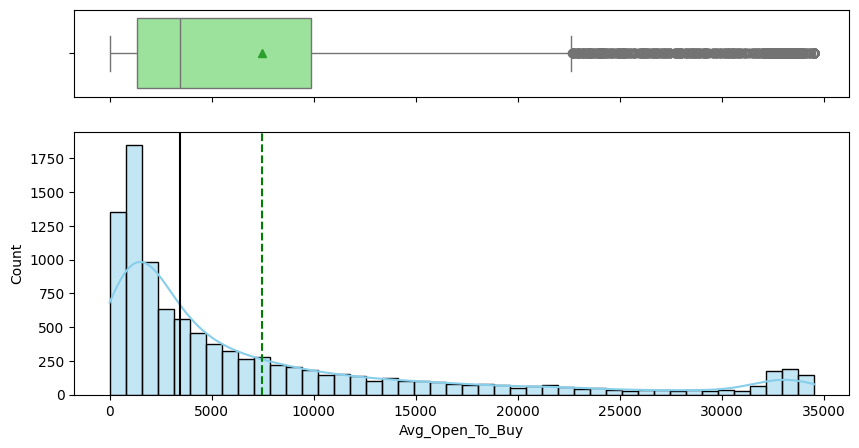

In [32]:
num_analysis_hist_box(data, "Avg_Open_To_Buy")

* *Data is right skewed*
* *Looks like many customers with high credit limit are not utilizing their credit limit*

***Observation on Total_Trans_Amt***

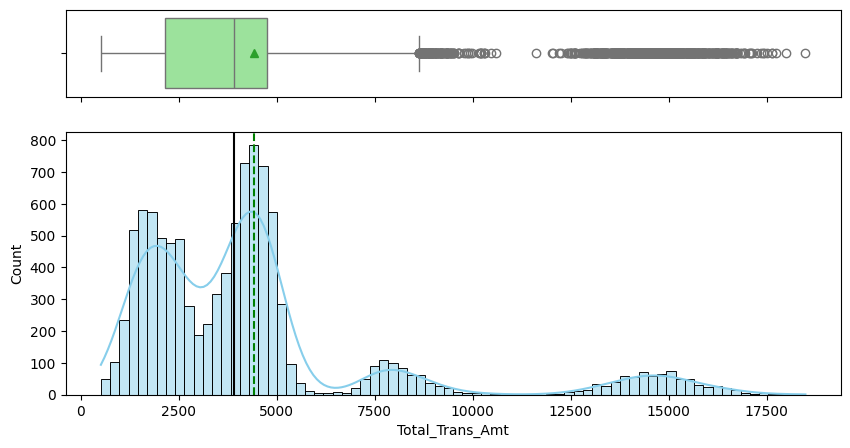

In [33]:
num_analysis_hist_box(data, "Total_Trans_Amt")

* *Data is right skewed*
* *Most of the customers spent less than 5K during 12 months*

***Observation on Total_Trans_Ct***

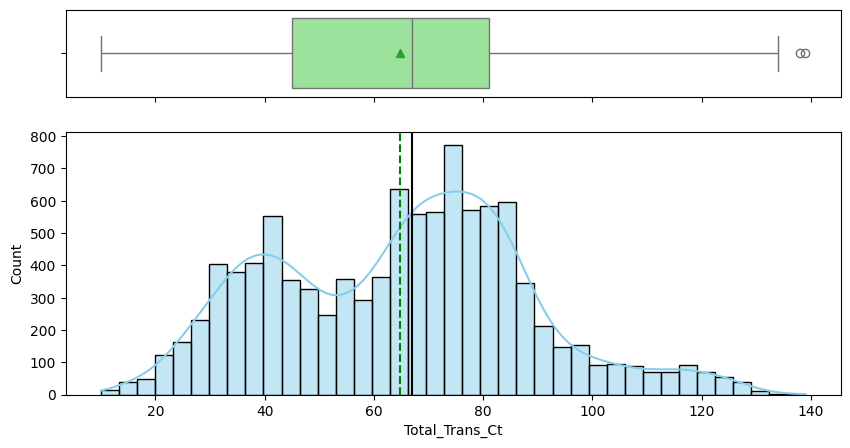

In [34]:
num_analysis_hist_box(data, "Total_Trans_Ct")

* *Data has bimodal distribution, with some outliers on right side*

***Observation on Total_Ct_Chng_Q4_Q1***

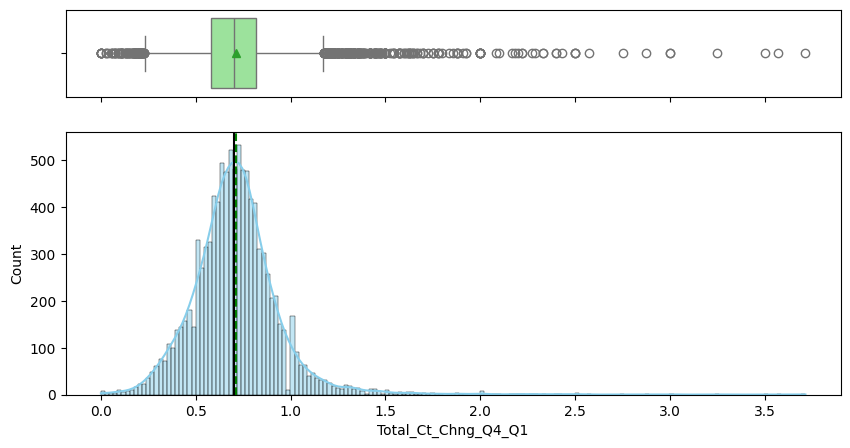

In [35]:
num_analysis_hist_box(data, "Total_Ct_Chng_Q4_Q1")

* *Data is right skewed*
* *Q4/Q1 ratiio is less than 1 for majority of customers*

***Observation on Total_Amt_Chng_Q4_Q1***

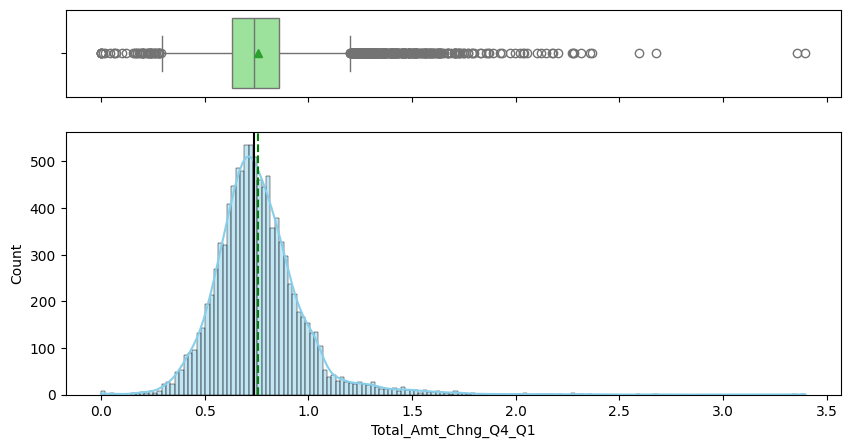

In [36]:
num_analysis_hist_box(data, "Total_Amt_Chng_Q4_Q1")

* *Data is right skewed*
* *Q4/Q1 raio is less than 1 for majority of customers*

***Observation on Avg_Utilization_Ratio***

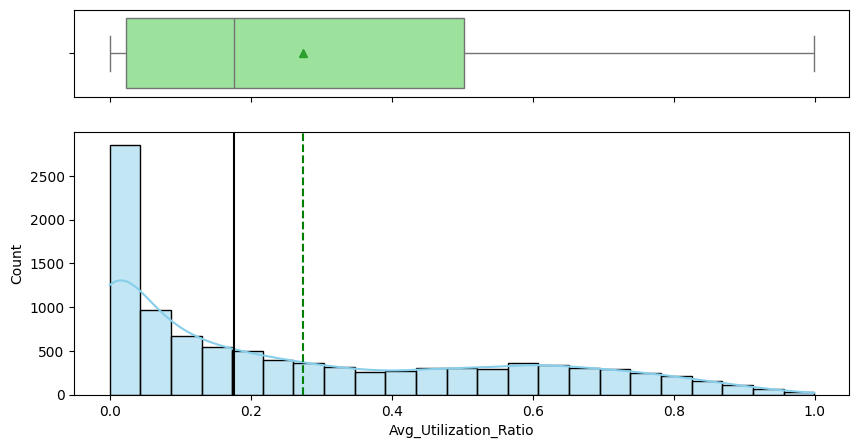

In [37]:
num_analysis_hist_box(data, "Avg_Utilization_Ratio")

* *Data is right skewed with long tail*

#### ***Bivariate Analysis***

***Helper Functions***

In [38]:
def target_distribution_by_category(data, x_col, hue_col, colormap='tab20', figsize=(6, 4), title=None):
    """
    Plots a stacked bar chart showing percentage distribution of hue_col within each x_col category,
    with percentage labels on each segment.
    """
    # Group and calculate percentages
    grouped = data.groupby([x_col, hue_col]).size().unstack(fill_value=0)
    percentages = grouped.div(grouped.sum(axis=1), axis=0) * 100

    # Plot
    ax = percentages.plot(kind='bar', stacked=True, figsize=figsize, colormap=colormap)

    # Add percentage labels
    for i, (index, row) in enumerate(percentages.iterrows()):
        cum_height = 0
        for j, value in enumerate(row):
            if value > 0:
                ax.text(
                    i,                      # x position
                    cum_height + value / 2, # y position (middle of the bar segment)
                    f'{value:.1f}%',        # label text
                    ha='center', va='center', fontsize=8, color='white'
                )
                cum_height += value

    plt.ylabel('Percentage')
    plt.title(title or f'{x_col} Distribution by {hue_col} (Stacked Percentage)')
    plt.legend(title=hue_col, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

In [39]:
### function to plot distributions wrt target
def num_feature_vs_target(data, predictor, target):
    sns.boxplot(data=data, x=target, y=predictor, palette="Set2", hue=target)
    plt.title(f'{predictor} distribution by {target}');
    plt.tight_layout()
    plt.show()	

***Gender and Attrition Flag***

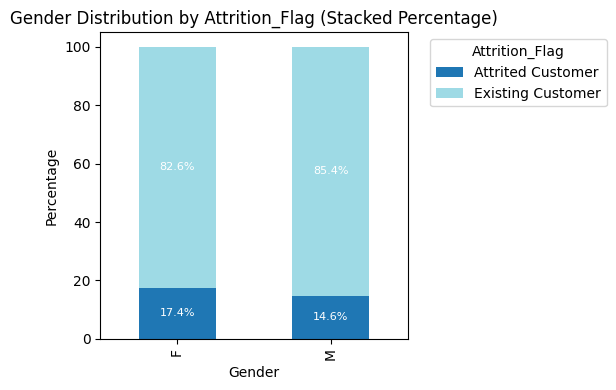

In [40]:
# Gender and Attrition Flag
target_distribution_by_category(data, "Gender", "Attrition_Flag")

- *From the data looks like, female customer is more at Attrition risk*

***Dependent_count and Attrition Flag***

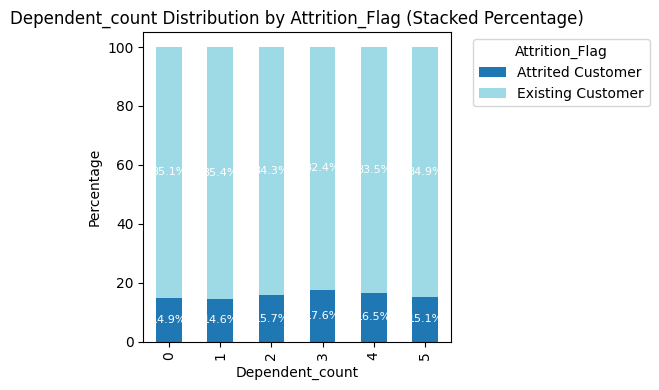

In [41]:
# Dependent_count and Attrition Flag
target_distribution_by_category(data, "Dependent_count", "Attrition_Flag")

- *Customers with 3 and 4 dependents are more at attrition risk*

***Education_Level and Attrition Flag***

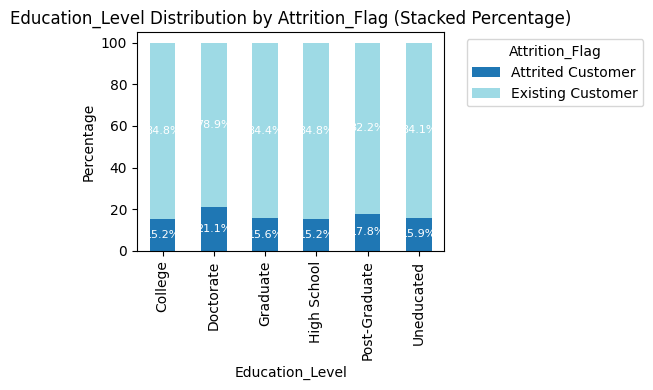

In [42]:
# Education_Level and Attrition Flag
target_distribution_by_category(data, "Education_Level", "Attrition_Flag")

- *Customers with education level Doctorate and Post-Graduate are more at attrition risk*

***Marital_Status and Attrition Flag***

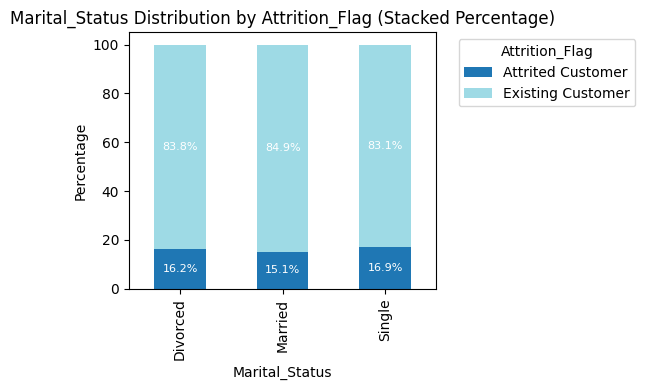

In [43]:
# Marital_Status and Attrition Flag
target_distribution_by_category(data, "Marital_Status", "Attrition_Flag")

- *Customers who are single and Divorced are more at attrition risk*

***Income_Category and Attrition Flag***

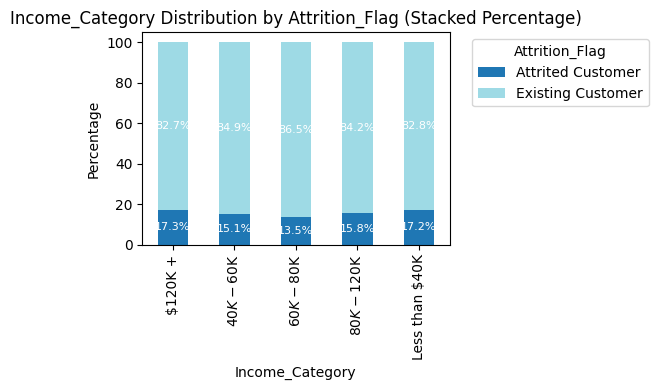

In [44]:
# Income_Category and Attrition Flag
target_distribution_by_category(data, "Income_Category", "Attrition_Flag")

- *Customers with higher than 120K and lesser than 40K income are more at risk of attrition*

***Card_Category and Attrition Flag***

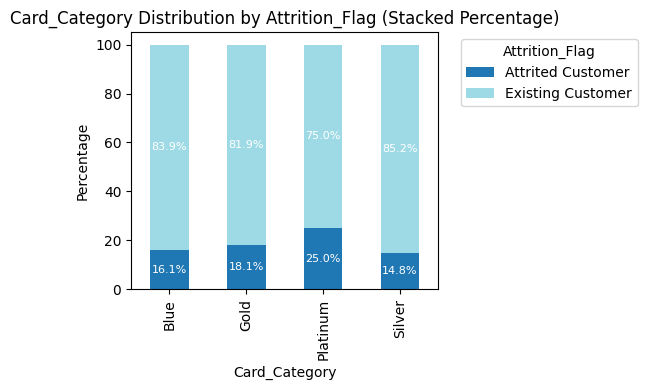

In [45]:
# Card_Category and Attrition Flag
target_distribution_by_category(data, "Card_Category", "Attrition_Flag")

- *Customers with Platinum card are more at attrition risk*

***Total_Relationship_Count and Attrition Flag***

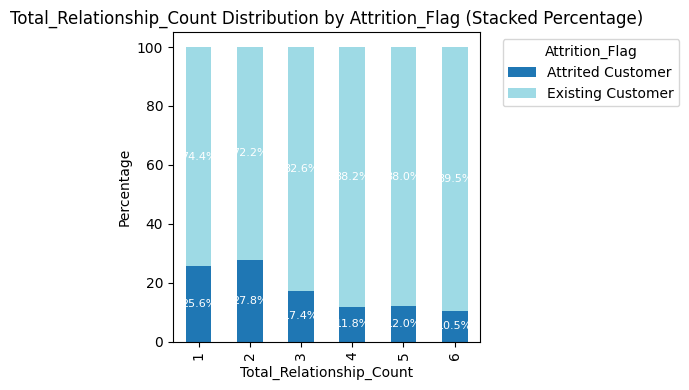

In [46]:
# Total_Relationship_Count and Attrition Flag
target_distribution_by_category(data, "Total_Relationship_Count", "Attrition_Flag")

- *Customers with products less than 3 are more at risk of attrition*

***Months_Inactive_12_mon and Attrition Flag***

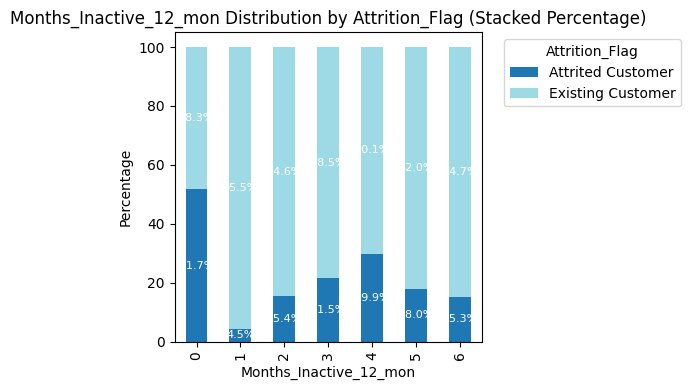

In [47]:
# Months_Inactive_12_mon and Attrition Flag
target_distribution_by_category(data, "Months_Inactive_12_mon", "Attrition_Flag")

- *As per the data, customers with zero inactive month are most risk of attrition, followed by 4 and 3 months*

***Contacts_Count_12_mon and Attrition Flag***

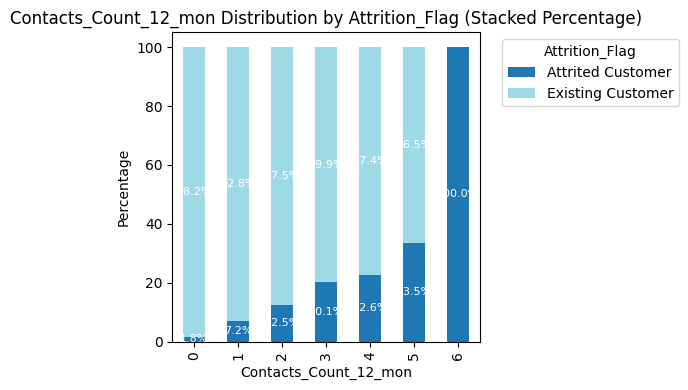

In [48]:
# Contacts_Count_12_mon and Attrition Flag
target_distribution_by_category(data, "Contacts_Count_12_mon", "Attrition_Flag")

- *customers who have more contacts with bank are at right risk of attrition*

***Customer Age vs Attribution Flag***

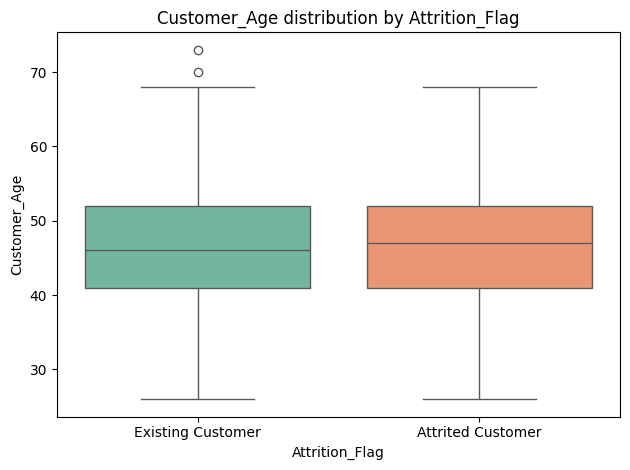

In [49]:
num_feature_vs_target(data, "Customer_Age", "Attrition_Flag")

- *Customer Age doesn't impact the attrition rate* 

***Months on Book vs Attrition Flag***

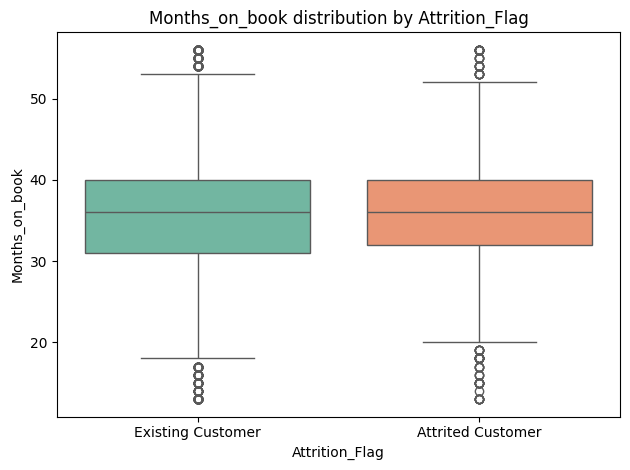

In [50]:
num_feature_vs_target(data, "Months_on_book", "Attrition_Flag")

- *Months on book doesn't seem to impact customer behavior in terms of attrition*

***Credit Limit vs Attrition Flag***

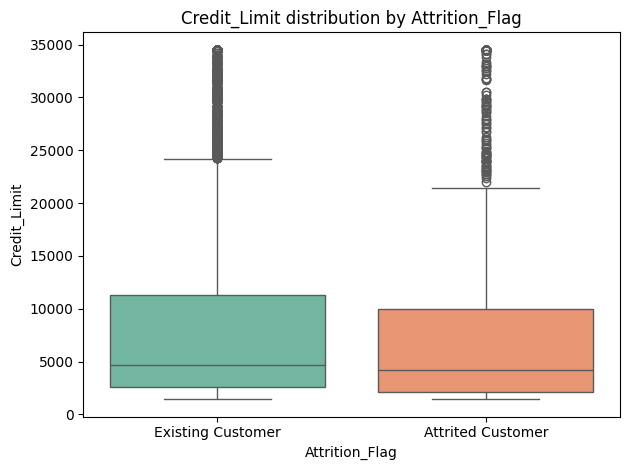

In [51]:
num_feature_vs_target(data, "Credit_Limit", "Attrition_Flag")

- *Customers with lower credit limit are at higher risk of attrition*

***Total Revolving Balance vs Attrition Flag***

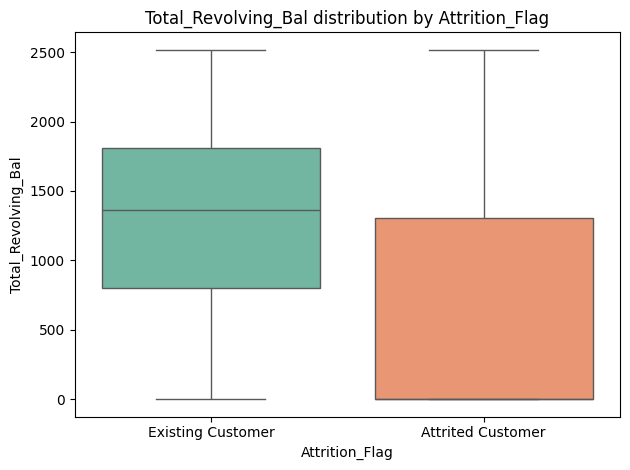

In [52]:
num_feature_vs_target(data, "Total_Revolving_Bal", "Attrition_Flag")

- *Customers with low total revolving balance are more at risk of attrition*

***Avg_Open_To_Buy vs Attrition_Flag***

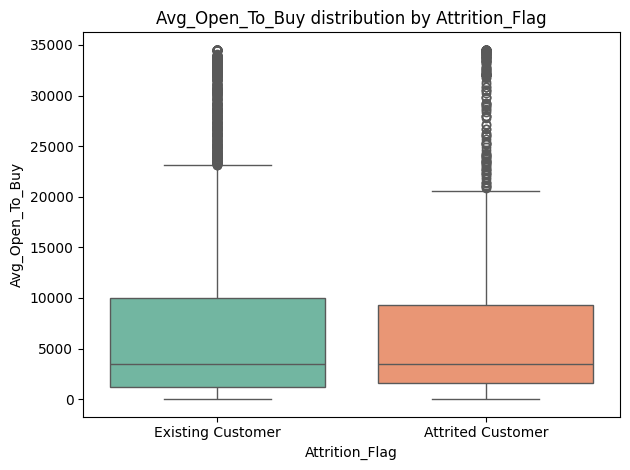

In [53]:
num_feature_vs_target(data, "Avg_Open_To_Buy", "Attrition_Flag")

- *Average Open to Buy doesn't seem to a factor in customer attrition*

***Total_Trans_Amt vs Attrition_Flag***

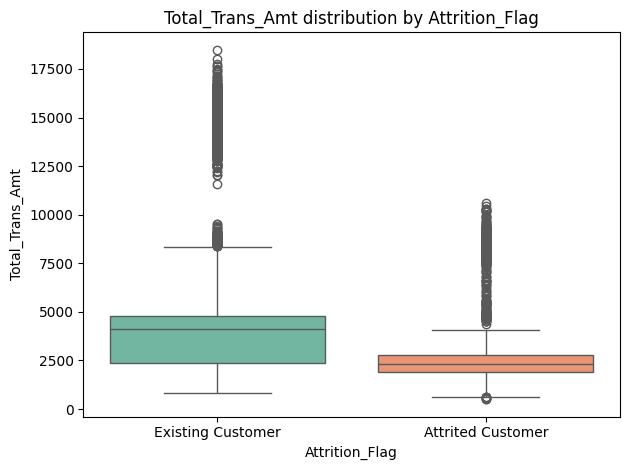

In [54]:
num_feature_vs_target(data, "Total_Trans_Amt", "Attrition_Flag")

- *Customers with lower transaction amount in last 12 months are more at risk of attrition*

***Total_Trans_Ct vs Attrition Flag***

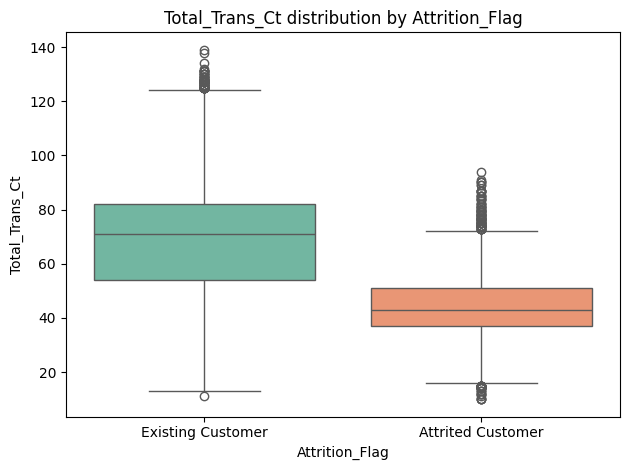

In [55]:
num_feature_vs_target(data, "Total_Trans_Ct", "Attrition_Flag")

- *Customers with lower transaction count in last 12 months are more at risk of attrition*

***Total_Amt_Chng_Q4_Q1 vs Attrition Flag***

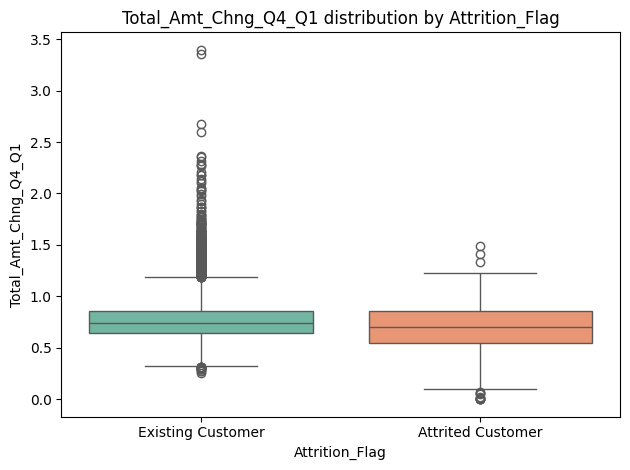

In [56]:
num_feature_vs_target(data, "Total_Amt_Chng_Q4_Q1", "Attrition_Flag")

- *Customer with lower ratio of Q4/Q1 amount is slightly higher risk of attrition*

***Total_Ct_Chng_Q4_Q1 vs Attrition Flag***

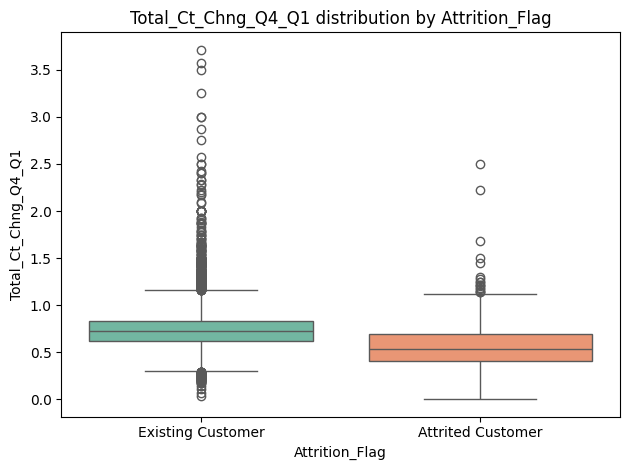

In [57]:
num_feature_vs_target(data, "Total_Ct_Chng_Q4_Q1", "Attrition_Flag")

- *Customer with lower ratio of Q4/Q1 count is slightly higher risk of attrition*

***Avg_Utilization_Ratio vs Attrition Flag***

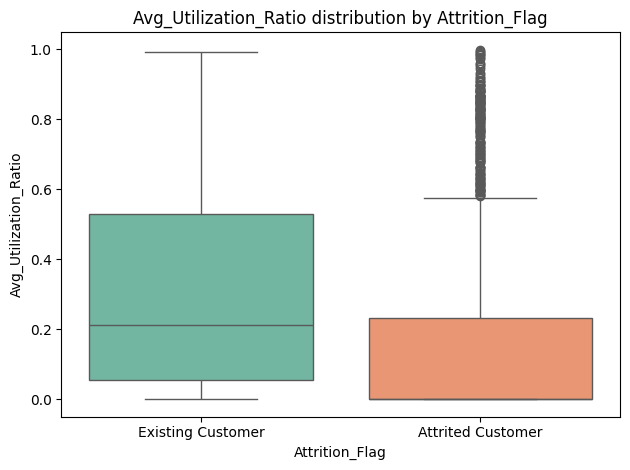

In [58]:
num_feature_vs_target(data, "Avg_Utilization_Ratio", "Attrition_Flag")

- *Customers with Lower Utilization ratio is more at risk of attrition*

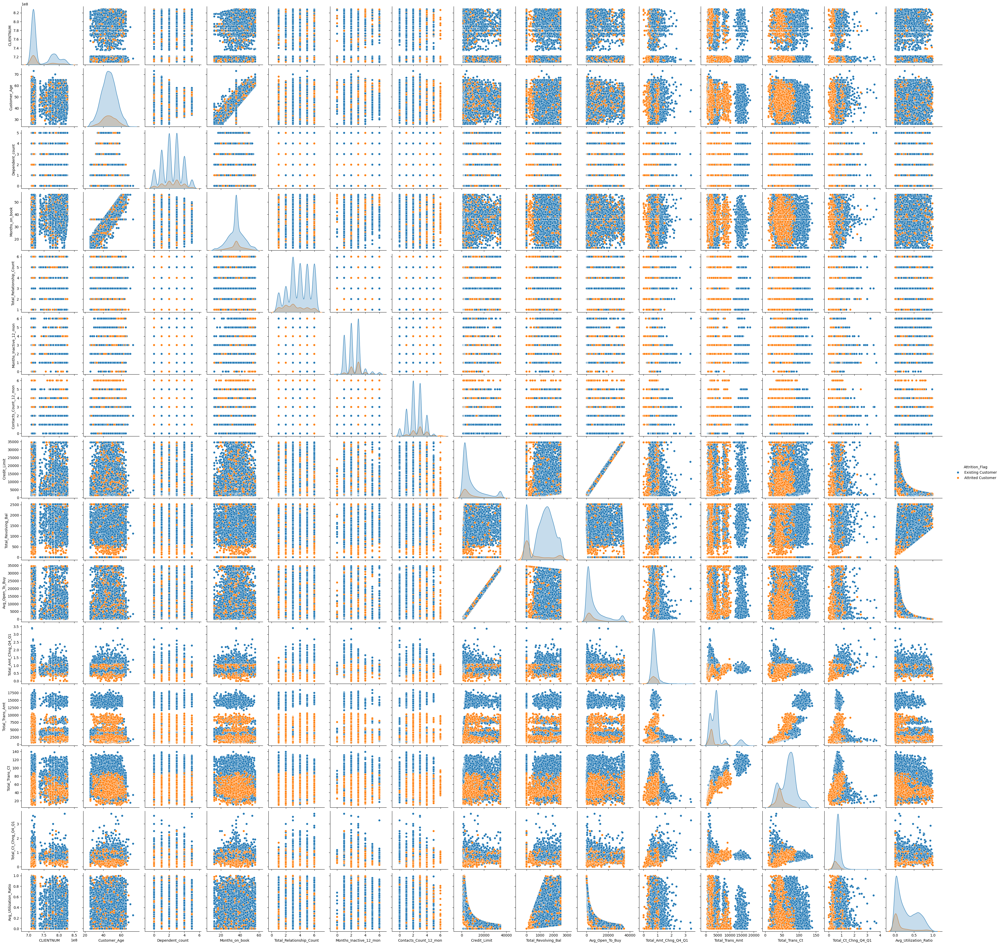

In [59]:
sns.pairplot(data, hue="Attrition_Flag");

***Key Observations***
- *Customers with lower transaction count in last 12 months are more at risk of attrition*
- *Customers with lower transaction amount in last 12 months are more at risk of attrition*
- *Customer with lower ratio of Q4/Q1 count is slightly higher risk of attrition*
- *Customer with lower ratio of Q4/Q1 amount is slightly higher risk of attrition*
- *customers who have more contacts with bank are at right risk of attrition*
- *Higher the credit limit, lower is the average utilization ratio*
- *Higher the average open to buy, lower the average utilization ratio*

#### ***Data Preprocessing***

In [60]:
# Dropping column - CLIENTNUM
data.drop(columns=["CLIENTNUM"], inplace=True)

In [61]:
# encoding target variable
data=data.replace({"Attrition_Flag":{"Attrited Customer":1,"Existing Customer":0}})

***Check for outliers***

In [62]:
# to find the 25th percentile and 75th percentile for the numerical columns
Q1 = data[num_cols].quantile(0.25)
Q3 = data[num_cols].quantile(0.75)

#Inter Quantile Range (75th percentile - 25th percentile)
IQR = Q3 - Q1

#Finding lower and upper bounds for all values. All values outside these bounds are outliers
lower_whisker = Q1 - 1.5*IQR
upper_whisker = Q3 + 1.5*IQR

print("Percentage of outliers in each column:")
# Percentage of outliers in each column
(((data[num_cols] < lower_whisker) | (data[num_cols] > upper_whisker)).sum()/data.shape[0]*100).sort_values(ascending=False)

Percentage of outliers in each column:


Credit_Limit            9.717
Avg_Open_To_Buy         9.509
Total_Trans_Amt         8.848
Total_Amt_Chng_Q4_Q1    3.910
Total_Ct_Chng_Q4_Q1     3.891
Months_on_book          3.812
Customer_Age            0.020
Total_Trans_Ct          0.020
Total_Revolving_Bal     0.000
Avg_Utilization_Ratio   0.000
dtype: float64

*Credit_Limit, Avg_Open_To_Buy and Total_Trans_Amt have outliers greater than 1.5 times IQR.*

In [63]:
# check the income for the folks who have credit limit greater than 30,000

#data[data['Credit_Limit']>33000].describe(include='all').T
data[data['Credit_Limit']>33000]['Income_Category'].value_counts(1)

Income_Category
$80K - $120K   0.461
$120K +        0.421
$60K - $80K    0.118
Name: proportion, dtype: float64

- *Almost 86% of customers have income greater than 80K. However 12% of customers have income in the range of 60K and 80K who have credit limit higher than 33K which doesn't seem impossible.*
- *We will keep the data as is, and not treat any columns for outliers*

#### ***Data Preparation for Modeling***

In [64]:
X = data.drop(["Attrition_Flag"], axis=1)
y = data["Attrition_Flag"]

***Data Split into Training, Validation and Test set: In 2 steps***

***1. First Split the data into Temp and Test***<br>
***2. Then Split the Temp into Train and Val***

In [65]:
X_temp, X_test, y_temp, y_test = train_test_split(X, y, test_size=0.2, random_state=1, stratify=y)

# then we split the temporary set into train and validation
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.25, random_state=1, stratify=y_temp)

print(X_train.shape, X_val.shape, X_test.shape)

(6075, 19) (2026, 19) (2026, 19)


In [66]:
# check the target variable to see class distribution
print('** before split **')
print(y.sum()/y.shape[0])
print()
print('** after split **')
print('training data',y_train.sum()/y_train.shape[0])
print('validation data',y_val.sum()/y_val.shape[0])
print('test data',y_test.sum()/y_test.shape[0])

** before split **
0.1606596227905599

** after split **
training data 0.16065843621399176
validation data 0.16090819348469892
test data 0.16041461006910168


#### ***Missing Value Treatment***

In [67]:
# train, val and test is imputed separately by most_frequent strategy

# instantiate or create object of SimpleImputer
imp_mode = SimpleImputer(missing_values=np.nan, strategy="most_frequent")

cols_to_impute = ["Education_Level", "Income_Category","Marital_Status"]

# fit and transform the imputer on train data
X_train[cols_to_impute] = imp_mode.fit_transform(X_train[cols_to_impute])

# Transform on validation and test data
X_val[cols_to_impute] = imp_mode.transform(X_val[cols_to_impute])

# fit and transform the imputer on test data
X_test[cols_to_impute] = imp_mode.transform(X_test[cols_to_impute])

In [68]:
X_train.isna().sum()

Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [69]:
X_val.isna().sum()

Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [70]:
X_test.isna().sum()

Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

***Create dummy variable for categorical variable***

In [71]:
# Creating dummy variables for categorical variables
X_train = pd.get_dummies(data=X_train, drop_first=True)
X_val = pd.get_dummies(data=X_val, drop_first=True)
X_test = pd.get_dummies(data=X_test, drop_first=True)

#### ***Model building - Default Parameters***

***Model evaluation criterion:***

***Model can make wrong predictions as:***
***1. Predicting a customer will renounce credit card but customer doesn't renounce - Loss of resources***<br>
***2. Predicting a customer will not renounce credit card and the customer renounces - Loss of opportunity***

***Which case is more important?*** 
* ***Predicting that customer will not renounce credit card and the customer renounces (FN). We have to reduce such possibilities.*** 

***How to reduce this loss i.e need to reduce False Negatives?***
* ***Company wants Recall to be maximized, greater the Recall lesser the chances of false negatives.***

***Trying All Classifiers with Default Parameters***

In [72]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Logistic", LogisticRegression(random_state=1)))
models.append(("dtree", DecisionTreeClassifier(random_state=1)))
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))

results = []  # Empty list to store all model's CV scores
names = []  # Empty list to store name of the models


# loop through all models to get the mean cross validated score
print("\n" "Cross-Validation Performance:" "\n")

for name, model in models:
    
    scoring = "recall"
    
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    
    cv_result = cross_val_score(
        estimator=model, X=X_train, y=y_train, scoring=scoring, cv=kfold
    )
    
    results.append(cv_result)
    
    names.append(name)
    
    print("{}: {}".format(name, round(cv_result.mean(),3)))

print("\n" "Training Performance:" "\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores = recall_score(y_train, model.predict(X_train))
    print("{}: {}".format(name, round(scores, 3)))


Cross-Validation Performance:

Logistic: 0.396
dtree: 0.781
Bagging: 0.786
Random forest: 0.753
Adaboost: 0.717
GBM: 0.812
Xgboost: 0.872

Training Performance:

Logistic: 0.497
dtree: 1.0
Bagging: 0.986
Random forest: 1.0
Adaboost: 0.777
GBM: 0.875
Xgboost: 1.0


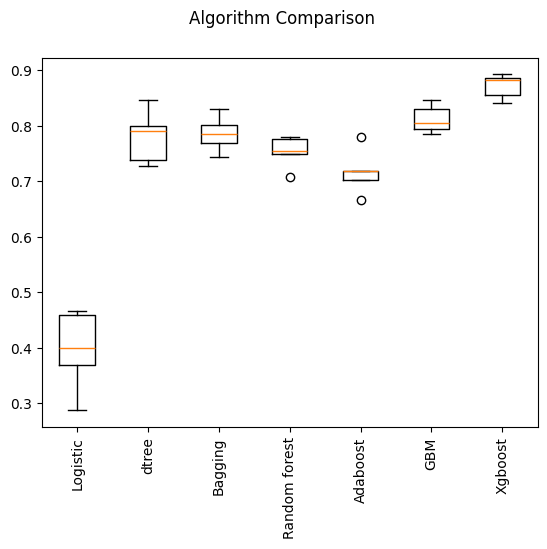

In [73]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure()

fig.suptitle("Algorithm Comparison")
ax = fig.add_subplot(111)

plt.boxplot(results)
ax.set_xticklabels(names, rotation=90)

plt.show()

- *We can see that XGBoost, GradientBoosting and Decition Tree is giving the highest cross-validated recall*

### Model building - Oversampled data

#### ***Oversampling train data using SMOTE***

In [74]:
print("Before UpSampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before UpSampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

# Synthetic Minority Over Sampling Technique
sm = SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1)  

X_train_over, y_train_over = sm.fit_resample(X_train, y_train)


print("After UpSampling, counts of label 'Yes': {}".format(sum(y_train_over == 1)))
print("After UpSampling, counts of label 'No': {} \n".format(sum(y_train_over == 0)))


print("After UpSampling, the shape of train_X: {}".format(X_train_over.shape))
print("After UpSampling, the shape of train_y: {} \n".format(y_train_over.shape))

Before UpSampling, counts of label 'Yes': 976
Before UpSampling, counts of label 'No': 5099 

After UpSampling, counts of label 'Yes': 5099
After UpSampling, counts of label 'No': 5099 

After UpSampling, the shape of train_X: (10198, 29)
After UpSampling, the shape of train_y: (10198,) 



In [75]:
models_over = []  # Empty list to store all the models

# Appending models into the list
models_over.append(("Logistic", LogisticRegression(random_state=1)))
models_over.append(("dtree", DecisionTreeClassifier(random_state=1)))
models_over.append(("Bagging", BaggingClassifier(random_state=1)))
models_over.append(("Random forest", RandomForestClassifier(random_state=1)))
models_over.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models_over.append(("GBM", GradientBoostingClassifier(random_state=1)))
models_over.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))

results_over = []  # Empty list to store all model's CV scores
names_over = []  # Empty list to store name of the models

# loop through all models to get the mean cross validated score
print("\n" "Cross-Validation Performance - Oversampling:" "\n")

for name, model in models_over:
    
    scoring = "recall"
    
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    
    cv_result_over = cross_val_score(
        estimator=model, X=X_train_over, y=y_train_over, scoring=scoring, cv=kfold
    )
    
    results_over.append(cv_result_over)
    
    names_over.append(name)

    print("{}: {}".format(name, round(cv_result_over.mean(), 3)))

print("\n" "Training Performance - Oversampling:" "\n")

for name, model in models_over:
    model.fit(X_train_over, y_train_over)
    scores_over = recall_score(y_train_over, model.predict(X_train_over))
    print("{}: {}".format(name, round(scores_over, 3)))


Cross-Validation Performance - Oversampling:

Logistic: 0.83
dtree: 0.952
Bagging: 0.967
Random forest: 0.984
Adaboost: 0.946
GBM: 0.972
Xgboost: 0.984

Training Performance - Oversampling:

Logistic: 0.802
dtree: 1.0
Bagging: 0.998
Random forest: 1.0
Adaboost: 0.946
GBM: 0.979
Xgboost: 1.0


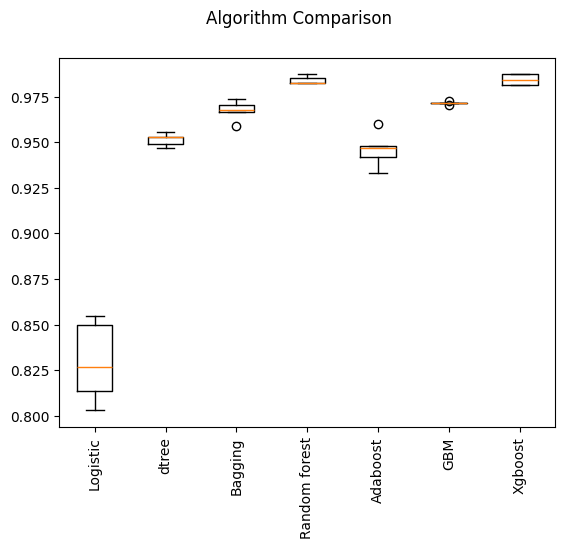

In [76]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure()

fig.suptitle("Algorithm Comparison")
ax = fig.add_subplot(111)

plt.boxplot(results_over)
ax.set_xticklabels(names_over, rotation=90)

plt.show()

- *XGBoost, Random Forest and GBM is giving best recall score with Oversampling*

#### ***Model building - Undersampling***

In [77]:
print("Before Under Sampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before Under Sampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

rus = RandomUnderSampler(random_state=1)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

print("After Under Sampling, counts of label 'Yes': {}".format(sum(y_train_un == 1)))
print("After Under Sampling, counts of label 'No': {} \n".format(sum(y_train_un == 0)))

print("After Under Sampling, the shape of train_X: {}".format(X_train_un.shape))
print("After Under Sampling, the shape of train_y: {} \n".format(y_train_un.shape))

Before Under Sampling, counts of label 'Yes': 976
Before Under Sampling, counts of label 'No': 5099 

After Under Sampling, counts of label 'Yes': 976
After Under Sampling, counts of label 'No': 976 

After Under Sampling, the shape of train_X: (1952, 29)
After Under Sampling, the shape of train_y: (1952,) 



In [78]:
models_un = []  # Empty list to store all the models

# Appending models into the list
models_un.append(("Logistic", LogisticRegression(random_state=1)))
models_un.append(("dtree", DecisionTreeClassifier(random_state=1)))
models_un.append(("Bagging", BaggingClassifier(random_state=1)))
models_un.append(("Random forest", RandomForestClassifier(random_state=1)))
models_un.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models_un.append(("GBM", GradientBoostingClassifier(random_state=1)))
models_un.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))

results_un = []  # Empty list to store all model's CV scores
names_un = []  # Empty list to store name of the models

# loop through all models to get the mean cross validated score
print("\n" "Cross-Validation Performance - Undersampling:" "\n")

for name, model in models_over:
    
    scoring = "recall"
    
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    
    cv_result_un = cross_val_score(
        estimator=model, X=X_train_un, y=y_train_un, scoring=scoring, cv=kfold
    )
    
    results_un.append(cv_result_un)
    
    names_un.append(name)

    print("{}: {}".format(name, round(cv_result_un.mean(), 3)))

print("\n" "Training Performance - Undersampling:" "\n")

for name, model in models_un:
    model.fit(X_train_un, y_train_un)
    scores_un = recall_score(y_train_un, model.predict(X_train_un))
    print("{}: {}".format(name, round(scores_un, 3)))


Cross-Validation Performance - Undersampling:

Logistic: 0.813
dtree: 0.889
Bagging: 0.91
Random forest: 0.93
Adaboost: 0.922
GBM: 0.944
Xgboost: 0.952

Training Performance - Undersampling:

Logistic: 0.822
dtree: 1.0
Bagging: 0.991
Random forest: 1.0
Adaboost: 0.945
GBM: 0.981
Xgboost: 1.0


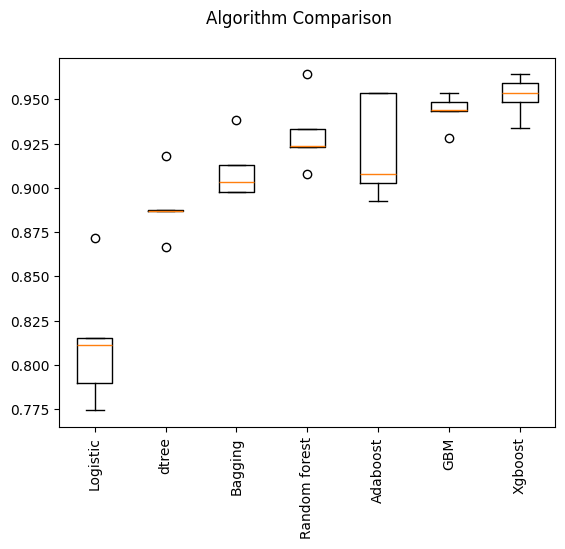

In [79]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure()

fig.suptitle("Algorithm Comparison")
ax = fig.add_subplot(111)

plt.boxplot(results_un)
ax.set_xticklabels(names_un, rotation=90)

plt.show()

*XGBoost, Adaboost and GBM is giving best recall score with Undersampling*

#### ***Hyperparameter tuning using random search***

***Choosing Adaboost, GBM and XGBoost for tuning based on the recall scores from previous cross validation steps*** 

***Helper Function***

In [80]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1": f1,},
        index=[0],
    )

    return df_perf

In [81]:
def confusion_matrix_sklearn(model, predictors, y_actual):
    """
    Generates a labeled confusion matrix heatmap.

    Parameters:
    - model: trained classifier
    - predictors: feature matrix to predict on (can be train, test, or validation)
    - y_actual: true labels corresponding to X
    """
    # Predict labels
    y_predict = model.predict(predictors)

    # Compute confusion matrix
    cm = confusion_matrix(y_actual, y_predict, labels=[0, 1])
    df_cm = pd.DataFrame(cm, index=["Actual - No", "Actual - Yes"],
                             columns=["Predicted - No", "Predicted - Yes"])

    # Annotate with counts and percentages
    group_counts = [f"{value:0.0f}" for value in cm.flatten()]
    group_percentages = [f"{value:.2%}" for value in cm.flatten() / np.sum(cm)]
    labels = [f"{count}\n{percent}" for count, percent in zip(group_counts, group_percentages)]
    labels = np.asarray(labels).reshape(cm.shape)

    # Plot heatmap
    plt.figure(figsize=(6, 4))
    sns.heatmap(df_cm, annot=labels, fmt='', cmap='Blues')
    plt.ylabel('Actual label')
    plt.xlabel('Predicted label')
    plt.title('Confusion Matrix')
    plt.tight_layout()
    plt.show()

#### ***Adaboosting - Using RandomizedSearchCV***

In [82]:
# defining model
abc = AdaBoostClassifier(random_state=1)

# Parameter grid to pass in RandomizedSearchCV

param_grid = {
    "n_estimators": np.arange(10, 110, 10),
    "learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
    "estimator": [
        DecisionTreeClassifier(max_depth=1, random_state=1,class_weight='balanced'),
        DecisionTreeClassifier(max_depth=2, random_state=1,class_weight='balanced'),
        DecisionTreeClassifier(max_depth=3, random_state=1,class_weight='balanced'),
    ],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=abc,
                                   param_distributions=param_grid,
                                   n_jobs = -1,
                                   n_iter=50,
                                   scoring=scorer,
                                   cv=5,
                                   random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': np.int64(60), 'learning_rate': 0.05, 'estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=3, random_state=1)} with CV score=0.9149293563579277:


In [83]:
# building model with best parameters
adc_tuned = AdaBoostClassifier(
    n_estimators=60,
    learning_rate=0.05,
    random_state=1,
    estimator=DecisionTreeClassifier(max_depth=3, random_state=1,class_weight='balanced'),
)

# Fit the model on training data
adc_tuned.fit(X_train, y_train)

,estimator,DecisionTreeC...andom_state=1)
,n_estimators,60
,learning_rate,0.05
,algorithm,'deprecated'
,random_state,1
,criterion,'gini'
,splitter,'best'
,max_depth,3
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0


Adaboost tuned Training performance:
   Accuracy  Recall  Precision    F1
0     0.907   0.934      0.646 0.764
*************************************


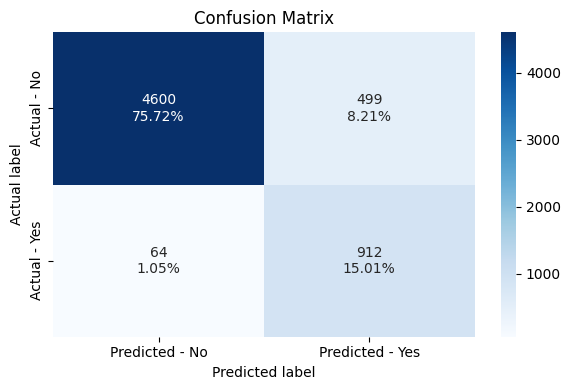

In [84]:
# Calculating different metrics on train set
Adaboost_train_tuned = model_performance_classification_sklearn(
    adc_tuned, X_train, y_train
)
print("Adaboost tuned Training performance:")
print(Adaboost_train_tuned)
print("*************************************")
# creating confusion matrix
confusion_matrix_sklearn(adc_tuned, X_train, y_train)

Adaboost tuned Validation performance:
   Accuracy  Recall  Precision    F1
0     0.904   0.936      0.637 0.758
*************************************


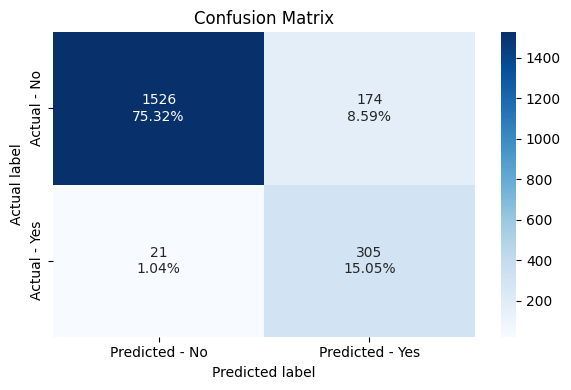

In [85]:
# Calculating different metrics on validation set
Adaboost_val_tuned = model_performance_classification_sklearn(
    adc_tuned, X_val, y_val
)
print("Adaboost tuned Validation performance:")
print(Adaboost_val_tuned)
print("*************************************")
# creating confusion matrix
confusion_matrix_sklearn(adc_tuned, X_val, y_val)

- *There is not much variation between training recall and validation recall which is good.* 

#### ***Gradient Boosting with RandomizedSearchCV***

In [86]:
# defining model
gbc = GradientBoostingClassifier(random_state=1)

# Parameter grid to pass in RandomizedSearchCV

param_grid = {
    "n_estimators": np.arange(10, 110, 10),
    "subsample":[0.8,0.9,1],
    "learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
    "max_features":[0.7,0.8,0.9,1],
    "max_depth":[1,2,3],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_gbc_cv = RandomizedSearchCV(estimator=gbc,
                                   param_distributions=param_grid,
                                   n_jobs = -1,
                                   n_iter=50,
                                   scoring=scorer,
                                   cv=5,
                                   random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_gbc_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_gbc_cv.best_params_,randomized_gbc_cv.best_score_))

Best parameters are {'subsample': 0.9, 'n_estimators': np.int64(100), 'max_features': 0.9, 'max_depth': 3, 'learning_rate': 0.2} with CV score=0.8544740973312402:


In [87]:
# building model with best parameters
gbc_tuned = GradientBoostingClassifier(
    random_state=1, 
    n_estimators=100,
    max_features=0.9,
    max_depth=3,
    subsample=0.9,
    learning_rate=0.2,
)

# Fit the model on training data
gbc_tuned.fit(X_train, y_train)

,loss,'log_loss'
,learning_rate,0.2
,n_estimators,100
,subsample,0.9
,criterion,'friedman_mse'
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_depth,3
,min_impurity_decrease,0.0
,init,None


GBC tuned Training performance:
   Accuracy  Recall  Precision    F1
0     0.987   0.939      0.977 0.957
*************************************


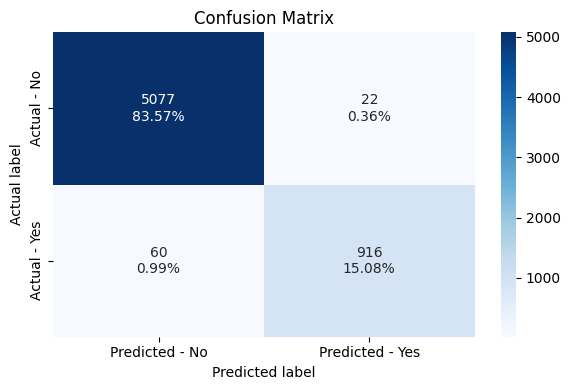

In [88]:
# Calculating different metrics on train set
gbc_train_tuned = model_performance_classification_sklearn(
    gbc_tuned, X_train, y_train
)
print("GBC tuned Training performance:")
print(gbc_train_tuned)
print("*************************************")
# creating confusion matrix
confusion_matrix_sklearn(gbc_tuned, X_train, y_train)

gbc tuned Validation performance:
   Accuracy  Recall  Precision    F1
0     0.971   0.883      0.935 0.909
*************************************


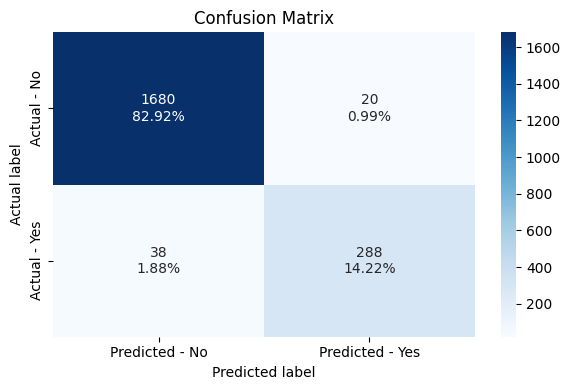

In [89]:
# Calculating different metrics on validation set
gbc_val_tuned = model_performance_classification_sklearn(
    gbc_tuned, X_val, y_val
)
print("gbc tuned Validation performance:")
print(gbc_val_tuned)
print("*************************************")
# creating confusion matrix
confusion_matrix_sklearn(gbc_tuned, X_val, y_val)

- *For Gradient boosting, recall for validation has dropped*

#### ***XGBoost with RandomizedSearchCV***

In [90]:
# defining model
xgb = XGBClassifier(random_state=1,eval_metric='logloss')

# Parameter grid to pass in RandomizedSearchCV
param_grid={'n_estimators':np.arange(50,150,50),
            'scale_pos_weight':[2,5,10],
            'learning_rate':[0.01,0.1,0.2,0.05],
            'gamma':[0,1,3,5],
            'subsample':[0.8,0.9,1],
            'max_depth':np.arange(1,5,1),
            'reg_lambda':[5,10]}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.f1_score)

#Calling RandomizedSearchCV
randomized_xgb_cv = RandomizedSearchCV(estimator=xgb,
                                       param_distributions=param_grid,
                                       n_iter=50,
                                       scoring=scorer,
                                       cv=5,
                                       random_state=1,
                                       n_jobs = -1)

#Fitting parameters in RandomizedSearchCV
randomized_xgb_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_xgb_cv.best_params_,randomized_xgb_cv.best_score_))

Best parameters are {'subsample': 0.9, 'scale_pos_weight': 2, 'reg_lambda': 10, 'n_estimators': np.int64(100), 'max_depth': np.int64(4), 'learning_rate': 0.2, 'gamma': 1} with CV score=0.8871975546505622:


In [91]:
# building model with best parameters
xgb_tuned = XGBClassifier(
    random_state=1,
    n_estimators=100,
    scale_pos_weight=2,
    gamma=1,
    subsample=0.9,
    learning_rate=0.2,
    eval_metric="logloss",
    max_depth=4,
    reg_lambda=10,
)
# Fit the model on training data
xgb_tuned.fit(X_train, y_train)

,objective,'binary:logistic'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,None
,device,None
,early_stopping_rounds,None
,enable_categorical,False
,eval_metric,'logloss'


XGB tuned Training performance:
   Accuracy  Recall  Precision    F1
0     0.987   0.982      0.942 0.961
*************************************


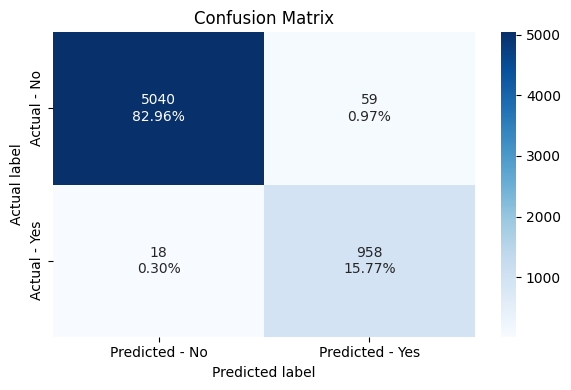

In [92]:
# Calculating different metrics on train set
xgb_train_tuned = model_performance_classification_sklearn(
    xgb_tuned, X_train, y_train
)
print("XGB tuned Training performance:")
print(xgb_train_tuned)
print("*************************************")
# creating confusion matrix
confusion_matrix_sklearn(xgb_tuned, X_train, y_train)

XGB tuned Validation performance:
   Accuracy  Recall  Precision    F1
0     0.971   0.920      0.904 0.912
*************************************


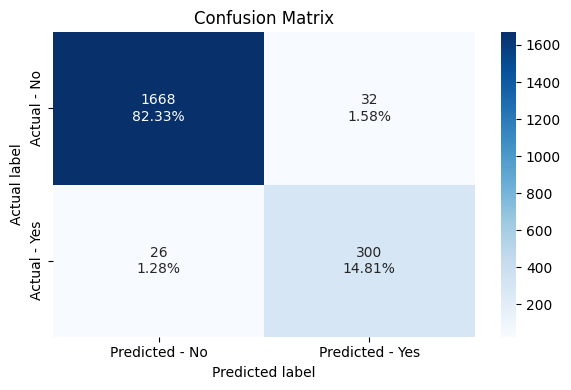

In [93]:
# Calculating different metrics on validation set
xgb_val_tuned = model_performance_classification_sklearn(
    xgb_tuned, X_val, y_val
)
print("XGB tuned Validation performance:")
print(xgb_val_tuned)
print("*************************************")
# creating confusion matrix
confusion_matrix_sklearn(xgb_tuned, X_val, y_val)

*I had to change the scoring to F1 in order to get this score, else when I tried scorer as Recall, I got everything classified as Yes*

### Model Performances

In [94]:
# training performance comparison

models_train_comp_df = pd.concat(
    [
        Adaboost_train_tuned.T,
        gbc_train_tuned.T,
        xgb_train_tuned.T,
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Adaboost Tuned Random Search",
    "Gradient Boost Tuned Random Search",
    "Xgboost Tuned with Random search",
]
print("Training performance comparison:")
models_train_comp_df.T

Training performance comparison:


,Accuracy,Recall,Precision,F1
Adaboost Tuned Random Search,0.907,0.934,0.646,0.764
Gradient Boost Tuned Random Search,0.987,0.939,0.977,0.957
Xgboost Tuned with Random search,0.987,0.982,0.942,0.961


In [95]:
# Validation performance comparison

models_val_comp_df = pd.concat(
    [
        Adaboost_val_tuned.T,
        gbc_val_tuned.T,
        xgb_val_tuned.T,
    ],
    axis=1,
)
models_val_comp_df.columns = [
    "Adaboost Tuned Random Search",
    "Gradient Boost Tuned Random Search",
    "Xgboost Tuned with Random search",
]
print("Validation performance comparison:")
models_val_comp_df.T

Validation performance comparison:


,Accuracy,Recall,Precision,F1
Adaboost Tuned Random Search,0.904,0.936,0.637,0.758
Gradient Boost Tuned Random Search,0.971,0.883,0.935,0.909
Xgboost Tuned with Random search,0.971,0.920,0.904,0.912


*Adaboost gives best performance on Validation data*

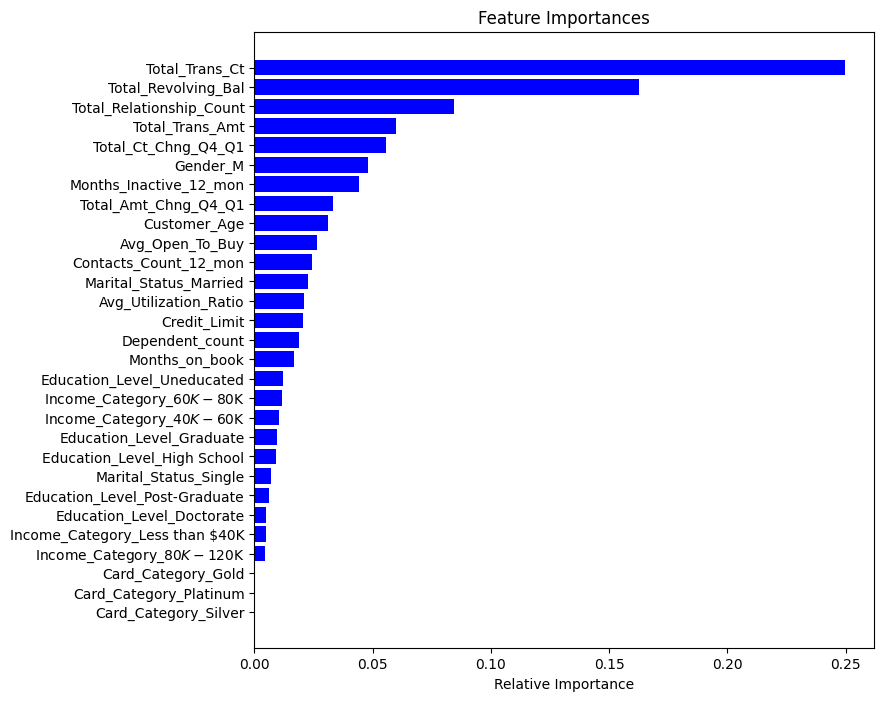

In [96]:
feature_names = X_train.columns
importances = xgb_tuned.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(8, 8))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="blue", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

*Top 3 performing features based on XGBoost*
* *Total_Trans_Ct*
* *Total_Revolving_Bal*
* *Total_Trans_Amt*

#### ***Productionize the model***

In [97]:
# creating a list of numerical variables
numerical_features = ["Customer_Age", "Months_on_book", "Credit_Limit","Total_Revolving_Bal","Avg_Open_To_Buy","Total_Trans_Amt",
                     "Total_Trans_Ct","Total_Ct_Chng_Q4_Q1","Total_Amt_Chng_Q4_Q1","Avg_Utilization_Ratio"]

# creating a transformer for numerical variables, which will apply simple imputer on the numerical variables
numeric_transformer = Pipeline(steps=[("imputer", SimpleImputer(strategy="median"))])

# creating a list of categorical variables

categorical_features = [
    "Gender",
    "Dependent_count",
    "Education_Level",
    "Marital_Status",
    "Income_Category",
    "Card_Category",
    "Total_Relationship_Count",
    "Months_Inactive_12_mon",
    "Contacts_Count_12_mon",
]    

# creating a transformer for categorical variables, which will first apply simple imputer and
# then do one hot encoding for categorical variables
categorical_transformer = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("onehot", OneHotEncoder(handle_unknown="ignore")),
    ]
)

# handle_unknown = "ignore", allows model to handle any unknown category in the test data

# combining categorical transformer and numerical transformer using a column transformer

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numerical_features),
        ("cat", categorical_transformer, categorical_features),
    ],
    remainder="passthrough",
)
# remainder = "passthrough" has been used, it will allow variables that are present in original data
# but not in "numerical_columns" and "categorical_columns" to pass through the column transformer without any changes

In [98]:
# Separating target variable and other variables
X = data.drop("Attrition_Flag", axis=1)
Y = data["Attrition_Flag"]

- *Now we already know the best model we need to process with, so we don't need to divide data into 3 parts*

In [99]:
# Splitting the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, Y, test_size=0.30, random_state=1, stratify=Y
)
print(X_train.shape, X_test.shape)

(7088, 19) (3039, 19)


In [100]:
# Creating new pipeline with best parameters
model = Pipeline(
    steps=[
        ("pre", preprocessor),
        (
            "XGB",
            XGBClassifier(
                random_state=1,
                n_estimators=50,
                scale_pos_weight=10,
                subsample=0.8,
                learning_rate=0.1,
                gamma=0,
                eval_metric="logloss",
                reg_lambda=10,
                max_depth=2,
            ),
        ),
    ]
)
# Fit the model on training data
model.fit(X_train, y_train)

,steps,"[('pre', ...), ('XGB', ...)]"
,transform_input,None
,memory,None
,verbose,False
,transformers,"[('num', ...), ('cat', ...)]"
,remainder,'passthrough'
,sparse_threshold,0.3
,n_jobs,None
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,True


In [101]:
model_performance_classification_sklearn(model, X_train, y_train)

,Accuracy,Recall,Precision,F1
0,0.853,0.977,0.523,0.681


In [102]:
model_performance_classification_sklearn(model, X_test, y_test)

,Accuracy,Recall,Precision,F1
0,0.842,0.980,0.504,0.665


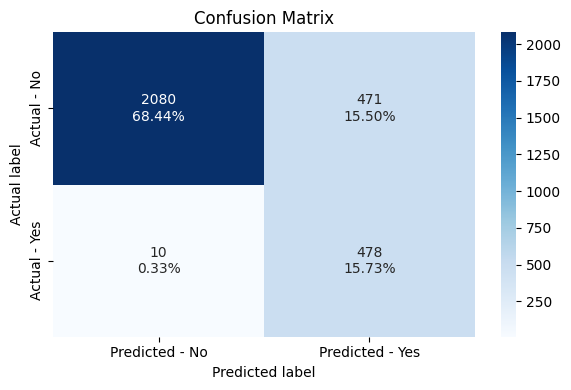

In [103]:
confusion_matrix_sklearn(model, X_test, y_test)

#### ***Actionable Insights & Recommendations***

- *XGBoost gave best recall, but precision dropped*
- *Female customer is more at Attrition risk, bank should focus on female customers*
- *Customers with 3 and 4 dependents are more at attrition risk, Bank should focus on them*
- *Bank should focus on customers with education level Doctorate and Post-Graduate as they are at higher risk of attrition*
- *Bank should focus on Single and Divorced customers*
- *Customers with higher than 120K and lesser than 40K income are more at risk of attrition, Bank should focus on them*
- *Customers with products less than 3 are more at risk of attrition, Bank should focus on selling more products to them*
- *Customers who have more contacts with bank are at right risk of attrition, bank should set up task force to find out what is unique about high interaction between customers and bank to avoid customer churn*
- *Customers with low total revolving balance are more at risk of attrition*
- *Customers with lower transaction count / amount in last 12 months are more at risk of attrition, Bank should ghem them promotion to increase their credit card transaction*